# Books: Data Prep & EDA

In [1]:
import pandas as pd
import numpy as np
import os
import re
import langid
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

## Book Info Data

In [2]:
def read_folder(csv_folder):  
    """Function to read csv files in a folder and concact all to one dataframe."""
    files = os.listdir(csv_folder)
    df = []
    for f in files:
        print(f)
        csv_file = csv_folder + "/" + f
        df.append(pd.read_csv(csv_file))
    df_full = pd.concat(df, ignore_index=True, sort=False)
    return df_full

In [3]:
df_books = read_folder('data/book_info')

book1-100k.csv
book1000k-1100k.csv
book100k-200k.csv
book1100k-1200k.csv
book1200k-1300k.csv
book1300k-1400k.csv
book1400k-1500k.csv
book1500k-1600k.csv
book1600k-1700k.csv
book1700k-1800k.csv
book1800k-1900k.csv
book1900k-2000k.csv
book2000k-3000k.csv
book200k-300k.csv
book3000k-4000k.csv
book300k-400k.csv
book4000k-5000k.csv
book400k-500k.csv
book500k-600k.csv
book600k-700k.csv
book700k-800k.csv
book800k-900k.csv
book900k-1000k.csv


In [4]:
df_books.head()

,Id,Name,RatingDist1,pagesNumber,RatingDist4,RatingDistTotal,PublishMonth,PublishDay,Publisher,CountsOfReview,...,Language,Authors,Rating,RatingDist2,RatingDist5,ISBN,RatingDist3,Description,Count of text reviews,PagesNumber
0,1,Harry Potter and the Half-Blood Prince (Harry ...,1:9896,652.0,4:556485,total:2298124,16,9,Scholastic Inc.,28062,...,eng,J.K. Rowling,4.57,2:25317,5:1546466,NaN,3:159960,NaN,NaN,NaN
1,2,Harry Potter and the Order of the Phoenix (Har...,1:12455,870.0,4:604283,total:2358637,1,9,Scholastic Inc.,29770,...,eng,J.K. Rowling,4.50,2:37005,5:1493113,0439358078,3:211781,NaN,NaN,NaN
2,3,Harry Potter and the Sorcerer's Stone (Harry P...,1:108202,309.0,4:1513191,total:6587388,1,11,Scholastic Inc,75911,...,eng,J.K. Rowling,4.47,2:130310,5:4268227,NaN,3:567458,NaN,NaN,NaN
3,4,Harry Potter and the Chamber of Secrets (Harry...,1:11896,352.0,4:706082,total:2560657,1,11,Scholastic,244,...,eng,J.K. Rowling,4.42,2:49353,5:1504505,0439554896,3:288821,NaN,NaN,NaN
4,5,Harry Potter and the Prisoner of Azkaban (Harr...,1:10128,435.0,4:630534,total:2610317,1,5,Scholastic Inc.,37093,...,eng,J.K. Rowling,4.57,2:24849,5:1749958,043965548X,3:194848,NaN,NaN,NaN


In [5]:
df_books.shape

(1850310, 21)

In [6]:
df_books.dtypes

Id                         int64
Name                      object
RatingDist1               object
pagesNumber              float64
RatingDist4               object
RatingDistTotal           object
PublishMonth               int64
PublishDay                 int64
Publisher                 object
CountsOfReview             int64
PublishYear                int64
Language                  object
Authors                   object
Rating                   float64
RatingDist2               object
RatingDist5               object
ISBN                      object
RatingDist3               object
Description               object
Count of text reviews    float64
PagesNumber              float64
dtype: object

In [7]:
df_books.isnull().sum()

Id                             0
Name                           0
RatingDist1                    0
pagesNumber              1015232
RatingDist4                    0
RatingDistTotal                0
PublishMonth                   0
PublishDay                     0
Publisher                  17826
CountsOfReview                 0
PublishYear                    0
Language                 1598488
Authors                        0
Rating                         0
RatingDist2                    0
RatingDist5                    0
ISBN                        5923
RatingDist3                    0
Description               679122
Count of text reviews    1440613
PagesNumber               835078
dtype: int64

### Missing Pages Number

Combine pagesNumber and PagesNumber columns

In [8]:
df_books['PagesNumber'] = df_books.apply(lambda row: row['pagesNumber'] if np.isnan(row['PagesNumber']) else row['PagesNumber'], axis=1) 

In [9]:
df_books.isnull().sum()

Id                             0
Name                           0
RatingDist1                    0
pagesNumber              1015232
RatingDist4                    0
RatingDistTotal                0
PublishMonth                   0
PublishDay                     0
Publisher                  17826
CountsOfReview                 0
PublishYear                    0
Language                 1598488
Authors                        0
Rating                         0
RatingDist2                    0
RatingDist5                    0
ISBN                        5923
RatingDist3                    0
Description               679122
Count of text reviews    1440613
PagesNumber                    0
dtype: int64

In [10]:
df_books.drop(['pagesNumber'], axis=1, inplace=True)

### English Title Books

In [11]:
df_books.loc[:,'Title_Lang'] = df_books.loc[:,'Name'].apply(lambda x: str(langid.classify(x)))

In [12]:
df_books = df_books[df_books['Title_Lang'].str.contains('en')]

### Captialize Book Titles

In [13]:
df_books.loc[:,'Name'] = df_books.loc[:,'Name'].str.title()

### Duplicated Books

In [14]:
df_books.duplicated().sum()

98

In [15]:
# drop duplicated rows
df_books.drop_duplicates(inplace=True)

In [16]:
# check for duplicated ID's
df_books.duplicated(subset=['Id']).sum()

74

In [17]:
df_books.drop_duplicates(subset=['Id'], inplace=True)

In [18]:
df_books.duplicated(subset=['Name']).sum()

209757

#### Explore duplicated names (book titles)

In [19]:
dup_name = df_books[df_books.duplicated(subset=['Name'], keep=False)]

In [20]:
for i in dup_name.Name:
    print(i)

Harry Potter And The Half-Blood Prince (Harry Potter, #6)
Harry Potter And The Order Of The Phoenix (Harry Potter, #5)
Harry Potter And The Sorcerer'S Stone (Harry Potter, #1)
Harry Potter And The Chamber Of Secrets (Harry Potter, #2)
Harry Potter And The Prisoner Of Azkaban (Harry Potter, #3)
Harry Potter And The Goblet Of Fire (Harry Potter, #4)
The Hitchhiker'S Guide To The Galaxy (Hitchhiker'S Guide To The Galaxy, #1)
A Short History Of Nearly Everything
Bill Bryson'S African Diary
In A Sunburned Country
I'M A Stranger Here Myself: Notes On Returning To America After Twenty Years Away
The Lost Continent: Travels In Small Town America
Neither Here Nor There: Travels In Europe
Notes From A Small Island
The Mother Tongue: English And How It Got That Way
The Lord Of The Rings (The Lord Of The Rings, #1-3)
The Fellowship Of The Ring (The Lord Of The Rings, #1)
The Lord Of The Rings: Weapons And Warfare
Guts: The True Stories Behind Hatchet And The Brian Books
Hatchet Jobs: Writings On C

The Evolution Of The Gilgamesh Epic
William Makepeace Thackeray
Candide
Candide And Other Stories (World'S Classics)
Candide, Zadig And Selected Stories
Voltaire Almighty: A Life In Pursuit Of Freedom
Philosophical Dictionary
The Unmasking Of Oscar Wilde
The Decline And Fall Of The Roman Empire
The History Of The Decline And Fall Of The Roman Empire
They Cage The Animals At Night
The Quilter'S Homecoming (Elm Creek Quilts, #10)
Trial By Journal
Absolutely Normal Chaos
My Perfect Life
All-American Girl (All-American Girl, #1)
All American Yemeni Girls: Being Muslim In A Public School
Ready Or Not (All-American Girl, #2)
Barron'S Sat 2400: Aiming For The Perfect Score
The Face On The Milk Carton (Janie Johnson, #1)
It'S Kind Of A Funny Story
Be More Chill
Regarding The Trees: A Splintered Saga Rooted In Secrets
Regarding The Sink: Where, Oh Where, Did Waters Go?
Hand To Mouth: A Chronicle Of Early Failure
The Book Of Illusions
The Spy Who Came In From The Cold
Moonraker
Eat, Pray, Love
E

Mommy, I Want To Sleep In Your Bed!
On Halloween Night
The Opposite Of Fate
The Best American Short Stories 1999
Bonesetter'S Daughter
The Horizontal World: Growing Up Wild In The Middle Of Nowhere
Horizontal Yellow: Nature And History In The Near Southwest
The Greek Islands
Clea
Spirit Of Place
Clear Light Of Day
The Zigzag Way
Fire On The Mountain
Fasting, Feasting
In Custody
Baumgartner'S Bombay
Burton On Burton
Tim Burton: A Child'S Garden Of Nightmares
The Nightmare Before Christmas
Tim Burton'S Nightmare Before Christmas: The Film, The Art, The Vision
The Occult: A History
The Occult
Abraham Lincoln And The Forge Of National Memory
The Way We Were: Remembering Diana
How To Improve Your Memory
Killer On The Road
Strip Poker
Your Cheatin' Heart
First Things First
The 7 Habits Of Highly Effective People: Powerful Lessons In Personal Change
The Speed Of Trust: The One Thing That Changes Everything
Abbo Of Fleury, Abbo Of Saint-Germain-Des-Pres, And Acta Sanctorum
Everything Bad Is Go

Black Inventors In The Age Of Segregation: Granville T. Woods, Lewis H. Latimer, And Shelby J. Davidson
Music In Cuba
Explosion In A Cathedral
The Kingdom Of This World
The Chase
The Lost Steps
Mexico Biography Of Power
Villa And Zapata: A History Of The Mexican Revolution
Zapata'S Revenge: Free Trade And The Farm Crisis In Mexico
Budapest
Border Boss: Manuel B. Bravo And Zapata County
The Life And Times Of Pancho Villa
Just Passing Through
68
Guevara, Also Known As Che
Regina'S Big Mistake
I Am Regina
The Red Hat Society'S Queens Of Woodlawn Avenue
Regina'S Song
Peace Begins With You
Protocols Of Reading
Semiotics And Interpretation
The Hard Life
Working: People Talk About What They Do All Day And How They Feel About What They Do
Hard Times: An Oral History Of The Great Depression
Race: How Blacks And Whites Think And Feel About The American Obsession
And They All Sang: Adventures Of An Eclectic Disc Jockey
American Dreams: Lost And Found
Division Street: America
The Emperor
Shah Of S

A History Of The Wife
Campfollowing: A History Of The Military Wife
Freddy And Fredericka
John Maynard Keynes: Volume 2: The Economist As Savior, 1920-1937
Women Of The World: The Great Foreign Correspondents
Through Their Eyes: Foreign Correspondents In The United States
They Only Look Dead: Why Progressives Will Dominate The Next Political Era
Why Americans Hate Politics
Nixon'S Shadow: The History Of An Image
Shadow: Five Presidents And The Legacy Of Watergate
Running The World: The Inside Story Of The National Security Council And The Architects Of American Power
The Assassins' Gate: America In Iraq
31 Days: The Crisis That Gave Us The Government We Have Today
Why I Am Still A Christian
Global Responsibility: In Search Of A New World Ethic
Eternal Life? Life After Death As A Medical, Philosophical & Theological Problem
Great Christian Thinkers
Infallible? An Inquiry
Credo
Justification: The Doctrine Of Karl Barth And A Catholic Reflection
The World'S Banker: A Story Of Failed State

Beguilement (The Sharing Knife, #1)
Betrayal Trauma: The Logic Of Forgetting Childhood Abuse
False Memory
Dead Man Walking
Sky Coyote (The Company, #2)
Edward Said And The Religious Effects Of Culture
The Glass Lake
The Nutcracker
The Stanislaski Sisters: Natasha And Rachel (Stanislaskis #1 & 3)
Hitler
Making Friends With Hitler: Lord Londonderry, The Nazis & The Road To War
Blackberry Wine
A Dirty Job
Conversations With James Thurber
Campaign Warriors: Political Consultants In Elections
The White Deer
Vital Signs: Perspectives On The Health Of American Campaigning
The Verneys: A True Story Of Love, War, And Madness In Seventeenth-Century England
Lady Of Hay
Wit'S End: Days And Nights Of The Algonquin Round Table
For Liberty And Glory: Washington, Lafayette, And Their Revolutions
Lyndon B. Johnson And American Liberalism: A Brief Biography With Documents
Secrets Of The Flesh: A Life Of Colette
Texas Aggies Go To War: In Service Of Their Country, Expanded Edition
The Five Of Hearts: An 

The Four Agreements: A Practical Guide To Personal Freedom
A Little Stranger
Dinner With A Perfect Stranger: An Invitation Worth Considering
Unrecounted
The Emigrants
First Wives Club
Pen Pals
Sun Pin: Military Methods
When She Was Good
Persons, Roles, And Minds: Identity In Peony Pavilion And Peach Blossom Fan
The Notorious Dr. August: His Real Life And Crimes
Lives Of The Circus Animals
Father Of Frankenstein
Scenes From A Receding Past
From Boys To Men: A Woman'S Guide To The Health Of Husbands, Partners, Sons, Fathers, And Brothers
Hitler'S African Victims: The German Army Massacres Of Black French Soldiers In 1940
Forgotten Victims: The Abandonment Of Americans In Hitler'S Camps
Dying Young
The Gilded Dinosaur: The Fossil War Between E.D. Cope And O.C. Marsh And The Rise Of American Science
Mystery At Jacob'S Well
The Problem With Murmur Lee
Daughter Of Witches (Lyra, #2)
Talking To Dragons (Enchanted Forest Chronicles, #4)
The Lion Graphic Bible: The Whole Story From Genesis To R

A Scarlet Cord
Scarlet Plume
The Scarlet Letter
The Scarlet Mansion
Malcolm X: A Fire Burning Brightly
Queering Teen Culture: All-American Boys And Same-Sex Desire In Film And Television
All That Hollywood Allows: Re-Reading Gender In 1950S Melodrama
All That Hollywood Allows: Re-Reading Gender In 1950S Melodrama
Mob Culture: Hidden Histories Of The American Gangster Film
Educating African American Males: Detroit'S Malcolm X Academy Solution
Night
Understanding Comics: The Invisible Art
Preacher, Volume 8: All Hell'S A-Coming
Magical Creatures
The Cake Mix Doctor
Cupcakes: From The Cake Mix Doctor
James Bond: The Secret World Of 007
James Bond: The Legacy 007
Burton: A Biography Of Sir Richard Francis Burton
The Kama Sutra Of Vatsyayana
The Thief Of Always
Cabal
Commodore Perry In The Land Of The Shogun
Selected Writings
Disney'S Beauty And The Beast: The Broadway Musical
Beast
Wild At Heart: Man And Beast In Southern Africa
The Incredible Hulk: What Savage Beast
The Man Who Would Be K

Star Of The Morning
Marketing Management
The Corner Of Rife And Pacific
Money And Banking
The Power Of The Dog
The History Of England, 6 Vols
The Pigman'S Legacy (The Pigman, #2)
Night Of The Bat
Raptor
Rats
Confessions Of A Teenage Baboon
My Darling, My Hamburger
Harry And Hortense At Hormone High
A Begonia For Miss Applebaum
The Effect Of Gamma Rays On Man-In-The-Moon Marigolds
Evidence Of Things Unseen
Cobra Ii: The Inside Story Of The Invasion And Occupation Of Iraq
In Search Of The Dharma: Memoirs Of A Modern Chinese Buddhist Pilgrim
Did Monkeys Invent The Monkey Wrench?: Hardware Stores And Hardware Stories
Table Of Contents
A Roomful Of Hovings And Other Profiles
The God Catchers: Experiencing The Manifest Presence Of God
[Sic]
The Feel-Good Curriculum: The Dumbing Down Of America'S Kids In The Name Of Self-Esteem
Are Men Necessary?: When Sexes Collide
Serial Murder
Sex Crimes: Patterns And Behavior
Sex Crimes
The Fort At River'S Bend (Camulod Chronicles, #5)
The Second Bend In 

Desert Flower
Gilles Deleuze'S Difference And Repetition: A Critical Introduction And Guide
Difference And Repetition
Negotiations, 1972-1990
The Logic Of Sense
Wikinomics: How Mass Collaboration Changes Everything
Realizing Metaphors: Alexander Pushkin And The Life Of The Poet
The Bronze Horseman: Selected Poems Of Alexander Pushkin
The Metamorphosis: And Other Short Stories
Heart Of Darkness
Heart Of Darkness And Selected Short Fiction
Makhmalbaf At Large: The Making Of A Rebel Filmmaker
The Films Of Makhmalbaf: Cinema, Politics & Culture In Iran
Sonnets From The Portuguese And Other Poems
The Town And The City
The Law
That Which Is Seen And That Which Is Not Seen
How To Make An Apple Pie And See The World
Two Little Girls In Blue
Consent To Kill (Mitch Rapp, #8)
The Best Investment Advice I Ever Received: Priceless Wisdom From Warren Buffett, Jim Cramer, Suze Orman, Steve Forbes, And Dozens Of Other Top Financial Experts
Ballpark: Camden Yards And The Building Of An American Dream
H

Emergent Issues In Education: Comparative Perspectives
Art And Fear: Observations On The Perils (And Rewards) Of Artmaking
Love Is Letting Go Of Fear
Fear Of Knowledge: Against Relativism And Constructivism
No Death, No Fear
Worst Fears Realized (Stone Barrington, #5)
Sleeping With Fear (Bishop/Special Crimes Unit #9; Fear #3)
The New American Militarism: How Americans Are Seduced By War
The Imperial Tense: Prospects And Problems Of American Empire
War Over Kosovo: Politics And Strategy In A Global Age
An Economic Interpretation Of The Constitution Of The United States
Island Of The Blue Dolphins
The Atlanta Riot: Race, Class, And Violence In A New South City
Memory And The Mediterranean
The Healing Nutrients Within: Facts, Findings, And New Research On Amino Acids
The Edge Effect: Achieve Total Health And Longevity With The Balanced Brain Advantage
Labor And Monopoly Capital: The Degradation Of Work In The Twentieth Century
Rethinking The Labor Process
When The Enemy Strikes: The Keys

Bacardi: The Hidden War
David The Gnome
The Descent Of Anansi
The Anatomy Of Error: Ancient Military Disasters And Their Lessons For Modern Strategists
Cowboy And His Friend
The Symposium
Lessons From The Intersexed
The Great Wheel
Nomads Of A Desert City: Personal Stories From Citizens Of The Street
The Mamur Zapt And The Return Of The Carpet (Mamur Zapt, #1)
Speech And Equality: Do We Really Have To Choose?
Helping Deaf And Hard Of Hearing Students To Use Spoken Language: A Guide For Educators And Families
Aunt Nancy And Old Man Trouble
Nature And The Idea Of A Man-Made World: An Investigation Into The Evolutionary Roots Of Form And Order In The Built Environment
Beast And Man: The Roots Of Human Nature
The Mouse Bride: A Mayan Folktale
Global Pharmaceuticals: Ethics, Markets, Practices
The Letter Of Marque
Class Warfare: Besieged Schools, Bewildered Parents, Betrayed Kids And The Attack On Excellence
Bloom
Black Water
Cold Pursuit
Where Serpents Lie
This Craft Of Verse
Special Circu

The Bostonians
Legacy Of The Tetons: Homesteading In Jackson Hole
Media, Gender And Identity: An Introduction
Writ In Blood (Saint-Germain, #10)
Magnificat
Monet'S Ghost
Lost For Words
Cautionary Tales
The Palace (Saint-Germain, #2)
False Dawn
Breaking Dawn (Twilight, #4)
Out There
Holy Land: A Suburban Memoir
Flesh And Blood (Alex Delaware, #15)
Flesh And Blood
Feminism And Philosophy: Essential Readings In Theory, Reinterpretation, And Application
Justice And Care: Essential Readings In Feminist Ethics
The Essential Difference
The New Quotable Woman
Girls Speak Out: Finding Your True Self
Portrait Of Alaska
Women'S Magazines, 1940-1960: Gender Roles And The Popular Press
Theories Of Political Economy
Christmas Wishes
Who Was David Weiser?
Clinical Sonography: A Practical Guide
The Mystery Of The Sinister Scarecrow (Alfred Hitchcock And The Three Investigators, #29)
The Mystery Of The Trail Of Terror (The Three Investigators, #39)
Climate Change And Biodiversity
Horror Films
Wit'Ch Fi

Opening To You: Zen-Inspired Translations Of The Psalms
Cabaret
Mama Provi And The Pot Of Rice
A Snout For Chocolate (Grandpa Spanielson'S Chicken Pox Stories #2)
Son Of Man
The House Of The Seven Gables
Hardly Working
Ufos
Esp
Beyond The Grave
The Death Of Vishnu
Philosophy In Dialogue: Plato'S Many Devices
Little Women
The Humor Of Kierkegaard: An Anthology
Paths In The Rainforests: Toward A History Of Political Tradition In Equatorial Africa
Healing Sounds From The Malaysian Rainforest: Temiar Music And Medicine
The Modern Conductor
Mark Wilson'S Complete Course In Magic
People And Places
Exchanging The Past: A Rainforest World Of Before And After
Walk When The Moon Is Full
We Are Their Heaven: Why The Dead Never Leave Us
Don'T Kiss Them Goodbye
Jim Crow Moves North: The Battle Over Northern School Segregation, 1865-1954
After Ovid: New Metamorphoses
A Book Of Dragons
The Slave Dancer
Gianni And The Ogre
The Principia: Mathematical Principles Of Natural Philosophy
Fractured Minds: A

North Korea: Another Country
Politics And Policy In Traditional Korea
The Evolution Of Retirement: An American Economic History, 1880-1990
Farmers Of Forty Centuries Or Permanent Agriculture In China, Korea And Japan
Korean Society: Civil Society, Democracy And The State
Korea: The Search For Sovereignty
Sourcebook Of Korean Civilization: From The Seventeenth Century To The Modern
Snapshot
Flowers
The Last Temptation (Tony Hill & Carol Jordan, #3)
Teen Moms: The Pain And The Promise
I Promise I'Ll Find You
Motocross Racing
Turquoise Mosaics From Mexico
Roping The Wind
Clinical Neuropsychology
First Among Equals: The Supreme Court In American Life
Volk'S Game
Clifford The Big Red Dog
Rhythmic Training
Restitution
Vicki
More Stories Huey Tells
And Now For Something Completely Trivial: The Monty Python Trivia And Quiz Book
Prisoner 1167: The Madman Who Was Jack The Ripper
Jack The Ripper
Jack The Ripper: Media, Culture, History
Lord Byron'S Novel: The Evening Land
The Lodger
Rounders
Here

Sicily: Three Thousand Years Of Human History
Song Of The West: Selected Poems Of Georg Trakl
The Miracle Life Of Edgar Mint
Steered By The Falling Stars: A Father'S Journey
Secrets Of Great Rainmakers: The Keys To Success And Wealth
This Day In American History
Heart Of Glass: Fiberglass Boats And The Men Who Made Them
On The Edge: Stories At The Brink
Dragon Ball, Vol. 3: The Training Of Kame-Sen'Nin (Dragon Ball, #3)
Dragon Ball, Vol. 2: Wish Upon A Dragon (Dragon Ball, #2)
Dragon Ball, Vol. 8: Taopaipai And Master Karin (Dragon Ball, #8)
Dragon Ball, Vol. 10: Return To The Tournament (Dragon Ball, #10)
Think And Grow Rich: A Black Choice
Germany
Ceremony In Lone Tree
Consuming Narratives: Gender And Monstrous Appetite In The Middle Ages And The Renaissance
When Least Is Best: How Mathematicians Discovered Many Clever Ways To Make Things As Small (Or As Large) As Possible
747: Creating The World'S First Jumbo Jet And Other Adventures From A Life In Aviation
The Messiah Of Morris Ave

The Unfinished Clue
Aurora
The Meaning Of Everything: The Story Of The Oxford English Dictionary
What Should I Do With My Life?: The True Story Of People Who Answered The Ultimate Question
It'S My Turn
Newton'S Cannon (Age Of Unreason, #1)
Revised Common Lectionary
An Ordinary Woman: A Dramatized Biography Of Nancy Kelsey
The Scarlet Lion (William Marshal, #3)
Shanna'S Ballerina Show
The Soldier'S Return
The Return Of The Soldier
The Hundred And One Dalmatians
Shadows On The Grass
Make Anger Your Ally: Harnessing Our Most Baffling Emotion
Tales Of The Jazz Age
Gronk
The Life And Death Of Mary Wollstonecraft
The Life And Death Of Mary Wollstonecraft
The Fourth Circle: A Political Ecology Of Sumatra’S Rainforest Frontier
Continents In Motion
Blood And Thunder: An Epic Of The American West
The Tree And The Vine
Timing
The Story And Its Writer: An Introduction To Short Fiction
Watchers In The Woods
A House In Bali
Pedagogy Of The Oppressed
The Many Faces Of Faith: A Guide To World Religion

Touch Not The Cat
Robert Crumb
Boy On A String: From Cast-Off Kid To Filmmaker Through The Magic Of Dreams
The White House Connection
Ottoman Manufacturing In The Age Of The Industrial Revolution
Masculinities And Crime: Critique And Reconceptualization Of Theory
Men And Violence (History Crime & Crmj)
Images Of Deviance And Social Control
Windjammers: Songs Of The Great Lakes Sailors
Prospero'S Daughter: The Prose Of Rosario Castellanos
Another Way To Be: Selected Works Of Rosario Castellanos
Undressing Cinema: Clothing And Identity In The Movies
Straight Talk About Criminals: Understanding And Treating Antisocial Individuals
Beginning And Intermediate Algebra
Her-2: The Making Of Herceptin, A Revolutionary Treatment For Breast Cancer
Lymphedema: A Breast Cancer Patient'S Guide To Prevention And Healing
Breast Pathology: Diagnosis By Needle Core Biopsy
The House Of Mirth
No Gifts From Chance: A Biography Of Edith Wharton
Traveling Hopefully: How To Lose Your Family Baggage And Jumpsta

In The Wake Of Madness: The Murderous Voyage Of The Whaleship Sharon
Rough Medicine: Surgeons At Sea In The Age Of Sail
Abigail
The Atlas Of North American Exploration: From The Norse Voyages To The Race To The Pole
Firing Line (The Destroyer, #41)
Before And After The Fall: New Poems
Childhood Regained: The Art Of The Storyteller
Philip Guston'S Poor Richard
Philip Guston'S Late Work: A Memoir
Losing My Mind: An Intimate Look At Life With Alzheimer'S
Over The Edge (Mysteries In Our National Park #7)
The Street Lawyer
What Became Of Her
The Cast Iron Forest: A Natural And Cultural History Of The North American Cross Timbers
I'Ll Love You When You'Re More Like Me
Old English Sheepdog
All I Did Was Ask: Conversations With Writers, Actors, Musicians, And Artists
The Altman Code (Covert-One, #4)
Best Practices In Educational Interpreting
A Fine And Pleasant Misery
The Man From St. Petersburg
Three
Red Velvet
One Wicked Night
Cruise Guide To Europe & The Mediterranean
Handbook Of Commonly U

Richthofen: Beyond The Legend Of The Red Baron
The Baby Doctors
The Dolorous Passion Of Our Lord Jesus Christ
Bearded Dragons
Tales Of The Witch World 2
The Crossroads Of Time
Gods And Androids
Flight Of Vengeance (Witch World Series 3: The Turning, #2)
Caroline
Robert'S Rules Of Order
The Peacekeepers
The Tie That Binds
A Staggering Revolution: A Cultural History Of Thirties Photography
Peter Pan
Isaac'S Storm: A Man, A Time, And The Deadliest Hurricane In History
Depression
Sympathy For The Devil
The Burden Of Sympathy: How Families Cope With Mental Illness
Compassion, Morality & The Media
A Tour On The Prairies
America'S Botanico-Medical Movements
The Waste Lands (The Dark Tower, #3)
Dreamcatcher
Dispatches From Palestine: The Rise And Fall Of The Oslo Peace Process
Tribute To Another Dead Rock Star
The Whistling Toilets
Family Dancing
New York From The Air
Some Plants Grow In Mid-Air (I Didn'T Know That)
The Teddy Bears' Picnic
Anchored In Love: An Intimate Portrait Of June Carter 

Someone At The Door
Hog-Eye
The Conjuror'S Bird
In The Midnight Hour (Laura Principal, #5)
Nellie Bly: A Name To Be Reckoned With
Churchill And America
The Fertility Diet
Expecting Teryk: An Exceptional Path To Parenthood
The Phantom Of The Opera
No Man'S Land (Frank Corso, #5)
The Day Of The Triffids
Sarah Lugg'S The Handcrafted Wedding: Special Touches For The Perfect Day
Cults
Outspoken: Free Speech Stories
One Fish, Two Fish, Red Fish, Blue Fish
The Gringo Trail
The Manchus
Crusader'S Cross (Dave Robicheaux, #14)
The Prentice Hall Reader
The American Heritage College Dictionary
Good Flies: Favorite Trout Patterns And How They Got That Way
The World Today: Concepts And Regions In Geography
Beyond The Constitution
The Bfg
Concepts And Regions In Geography
The Boy Of The Bells
Common Prayers: Faith, Family And A Christian'S Journey Through The Jewish Year
Creation
Early Greek Philosophy
East Asia: A New History
The End Of The Republican Era
The Gendered Worlds Of Latin American Women 

In Perfect Timing: Memoirs Of A Man For The New Millennium
Perfect Timing
The Moon'S Revenge
A Small Pinch Of Weather
Sam'S Letters To Jennifer
Travels
Here'S How
Judy Garland
Making Love To The Minor Poets Of Chicago: A Novel
Witch Twins And Melody Malady
Marlene Dietrich: Photographs And Memories
The 10 Second Kiss
Mary Mcleod Bethune
Consuming Culture: Why You Eat What You Eat
Sport, Identity And Ethnicity
The Mermaid'S Twin Sister: More Stories From Trinidad
The Warrior And The Wise Man
Acting On Impulse
See You Later, Alligator
Mad Dogs
Clea'S Moon
Equine Massage: A Practical Guide
Billy Pink'S Private Detective Agency
Home For The Holidays
Stick To Drawing Comics, Monkey Brain!
Chicken Soup With Rice: A Book Of Months
The Oxford Illustrated Dictionary Of Australian History
The Oxford Literary Guide To Australia
Little Hippo Gets Glasses
Henry I
The Quail Club
The Greatest Escape Stories Ever Told: Twenty-Five Unforgettable Tales
Fatal
Extreme Measures
The Orion Mystery: Unlocking

Sf Compact
Global Marketing Management
Looking Good: College Women And Body Image, 1875-1930
Hungry Men
Keeper (Atticus Kodiak, #1)
The Clay Ladies
Rebecca'S Daughters
Lowriders
Powerboats
Cranes
"Let'S Get A Pup!" Said Kate
Glencoe Health, Student Edition
Lines Of Activity: Performance, Historiography, Hull-House Domesticity
Absalom, Absalom!
Jurassic Park Iii
A Rhetoric Of Doing: Essays On Written Discourse In Honor Of James L. Kinneavy
Killing Ground On Okinawa: The Battle For Sugar Loaf Hill
Managing Sino-American Crises: Case Studies And Analysis
She Who Remembers
She Who Remembers
The Man Who Rode Midnight
Casanova
Fresh Water
The Archaeology Of Athens
Clinical Neurology
Tragic Ways Of Killing A Woman
Contemporary Chinese Politics: An Introduction
Throwing The Emperor From His Horse: Portrait Of A Village Leader In China, 1923-1995
A Great Improvisation: Franklin, France, And The Birth Of America
Saint-Exupery
Saint-Exupery: A Biography
China And The Taiwan Issue: Incoming War At

Double Cross
A Short History Of Canada
The Meme Machine
The Klone And I
An Owl On Every Post
A Leaf In The Wind
A Leaf In The Wind
Another Fine Myth (Myth Adventures, #1)
Master Georgie
Language
The Bloodstone Papers
Bloodstone
Gobbolino The Witch'S Cat
New Challenges For Documentary
Cardcaptor Sakura: Master Of The Clow, Vol. 1 (Cardcaptor Sakura, #7)
Splitting The Difference: Gender And Myth In Ancient Greece And India
Life Sentences
Full Circle
Flying Over 96Th Street: Memoir Of An East Harlem White Boy
Loki
Goodnight Sweet Prince (Lord Francis Powerscourt, #1)
Music Of The Whole Earth
The Mission Song
The Night Manager
Our Game
The Trip
No Graves As Yet (World War I, #1)
Stud: Adventures In Breeding
Anna'S Pet
Captive
Care In The Community: Challenge And Demonstration
The Flying Garbanzos
Napoleon And The Hundred Days
The Big Garage On Clear Shot
Hissy Fit
Swords Against Wizardry (Fafhrd And The Gray Mouser, #4)
Swords In The Mist (Fafhrd And The Gray Mouser, #3)
Childhood Rising
M

The Daisy Chain
I Don'T Mean To Smash Your Tomatoes, Honey!: A Glimpse At Life'S Perspectives From A To Z
Joker
It'S Time!
Literature, Psychoanalysis And The New Sciences Of Mind
Huggly Takes A Bath (Huggly, #2)
To Be Someone
Are You My Mother?
Elegant Glassware Of The Depression Era: Identification And Value Guide
Farmhouse Cookery
Cooking From A Country Farmhouse
Public Policy: Perspectives And Choices
The Messenger
A Companion To Political Geography
Berlusconi'S Italy: Mapping Contemporary Italian Politics
Wright Studies, Volume Two: Fallingwater And Pittsburgh
Kareem!: Basketball Great
Martha: The Life And Work Of Martha Graham
The Practical Talmud Dictionary
Creating Stores On The Web
Lutheran Book Of Prayer
Understanding Work And Employment: Industrial Relations In Transition
Hanoi
The Reservoir
On Our Way To Beautiful: A Family Memoir
He Say, She Say
The Heart Of Things: Applying Philosophy To The 21St Century
Facing The Wolf: Inside The Process Of Deep Feeling Therapy
The Secre

The Dons: Mentors, Eccentrics And Geniuses
Christianity And Classical Culture: A Study Of Thought And Action From Augustus To Augustine
Power And Persuasion In Late Antiquity: Towards A Christian Empire
Leadership Tripod: A New Model For Effective Leadership
A Gift From The Heart
Pieces
Meeting The Tree Of Life: A Teacher'S Path
Tantra: Sex, Secrecy, Politics, And Power In The Study Of Religion
The Rascal King: The Life And Times Of James Michael Curley (1874-1958)
Technologies Of Procreation: Kinship In The Age Of Assisted Conception
The Bead Maker
Appearances
Caught In The Act
Sheepwrecked
The Complete Floral Healer
Ill Effects: The Media Violence Debate
Tribal Nation: The Making Of Soviet Turkmenistan
Eyes Of A Child
Wolves
Mr Wolf And The Enormous Turnip
The Wolves Of Willoughby Chase (The Wolves Chronicles, #1)
Midnight Falcon (The Rigante, #2)
Wolf In Shadow (Jon Shannow, #1)
Fall Of Kings (Troy, #3)
The Monsters Of Templeton
Pharaoh
Jesus And The Spirit: A Study Of The Religious

Rembrandt
The Red Heifer
Stories Of The Pilgrims
The Source
Missing Magic
No Such Things
I Get On The Bus
Do And Dare: A Brave Boy'S Fight For Fortune
Do And Dare
The Adversity Advantage: Turning Everyday Struggles Into Everyday Greatness
Having A Mary Heart In A Martha World: Finding Intimacy With God In The Busyness Of Life
Backwater
Bourbon Street Blues (Scotty Bradley, #1)
Active Galactic Nuclei: From The Central Black Hole To The Galactic Environment
Jack'S Ward
Wynton Marsalis: Skain'S Domain: A Biography
Night Flying
Convex Polytopes
Back To School
To Live Again
Making The American Religious Fringe: Exotics, Subversives, And Journalists, 1955-1993
Ten Out Of Bed
The Death And Rebirth Of American Radicalism
We Called Each Other Comrade: Charles H. Kerr And Company, Radical Publisher (History Of Communication)
The Americanization Of Benjamin Franklin
War Of Words: Language, Politics And 9/11
Inner Peace For Busy People
The Burden Of Support: Young Latinos In An Aging Society
Devil

Six Names Of Beauty
Freedom And Community: The Ethics Of Interdependence
Bibliography Of Forbidden Books 1
Bibliography Of Forbidden Books 2
Bibliography Of Forbidden Books 3
Choices: Sex In The Age Of Stds
Focus
The Health And Well-Being Of Caribbean Immigrants In The United States
Homesick
Mystery Of The Roman Ransom
A Roman Ransom (Libertus Mystery Of Roman Britain, #8)
Mara, Daughter Of The Nile
Master Cornhill
The Endless Steppe: Growing Up In Siberia
Mum'S The Word (A Flower Shop Mystery, #1)
Leave A Candle Burning (Tucker Mills, #3)
Caught In The Middle East: U.S. Policy Toward The Arab-Israeli Conflict, 1945-1961
Woodrow Wilson And Harry Truman: Mission And Power In American Foreign Policy
Mostly Harmless (Hitchhiker'S Guide, #5)
The Wit And Wisdom Of Quentin Crisp
If Only It Were True
Iron Orchid (Holly Barker, #5)
Win Your Case: How To Present, Persuade, And Prevail--Every Place, Every Time
Dummy Up And Deal: Inside The Culture Of Casino Dealing
An Enquiry Into The Obligation

Cheeses Of The World
Into The Web
To Weave A Web Of Magic (Samaria Chronological Order #3.5)
The Gospel According To Larry
Mad In America: Bad Science, Bad Medicine, And The Enduring Mistreatment Of The Mentally Ill
My Funny Guy (Sweet Dreams, #220)
Before I Was Your Mother
Great Hollywood Wit: A Glorious Cavalcade Of Hollywood Wisecracks, Zingers, Japes, Quips, Slings, Jests, Snappers, & Sass From The Stars
Microwave Engineering
The Liberation Of Christmas: The Infancy Narratives In Social Context
Unsaid
Turn Off Your Mind: The Mystic Sixties & The Dark Side Of The Age Of Aquarius
The Body Politic: Corporeal Metaphor In Revolutionary France, 1770-1800
Therese Raquin
A Caldecott Celebration: Six Artists Share Their Paths To The Caldecott Medal
Anansi The Spider: A Tale From The Ashanti
The House That Jack Built
Mr. Rabbit And The Lovely Present
The Arraignment (Paul Madriani, #7)
Bible Code Ii: The Countdown
Evenings At Five
Late For The Wedding
Wild Orchids
In Silence
The Big Snow
The

Introductory And Intermediate Algebra
Bob Dylan: A Biography
Bob Dylan: The Recording Sessions, 1960-1994
Bob Dylan
The Dylan Companion
Isis: A Bob Dylan Anthology
Puss In Boots
Hideaways: Cabins, Huts, And Treehouse Escapes
The First World War
Harold Monro: Poet Of The New Age
The Winter Of The World
Bad Company
Bad Behaviour
Harold Monro: Poet Of The New Age
Poetry Of The First World War
The Glaucomas
Dangerous Animals
Night Creatures
Sea Creatures
Sharks
Wild Weather
Sleeping Beauty
Jenny'S Story
Pamela
Olympics
Dakota Dream
Moonglow
The X Factor: A Quest For Excellence
Mallory And The Mystery Diary (The Baby-Sitters Club, #29)
Soldiers To Citizens: The G.I. Bill And The Making Of The Greatest Generation
Claudia And The Phantom Phone Calls (The Baby-Sitters Club, #2)
Once In A Blue Moon
F2F
Telling Secrets
Framing The West: Images Of Rural Ireland, 1891-1920
At The Back Of The North Wind
Flow Visualization
Earthly Delights
Whose Property?: The Deepening Conflict Between Private Prop

The Great Stink
Welcome To The World, Baby Girl!
The American Enemy: The History Of French Anti-Americanism
My Latest Grievance
Pay It Forward
A Faint Cold Fear
Never Look Back (Look Trilogy, #2)
Never Look Back
C Programming: A Modern Approach
Exiles
Undertow
We Are Family
Mountain, Get Out Of My Way: Life Lessons And Learned Truths
One Love
Night Of The Moonjellies
The Enchanted April
Peyton Manning
Pleasure Control (Pleasure Games, #1)
Cover To Cover
Fiske Guide To Colleges
Whispers From Yesterday
Knowing Our Own Minds
Operation: Homefront
Lives Of The Poets
Iambic Ideas: Essays On A Poetic Tradition From Archaic Greece To The Late Roman Empire
Rainbow Of Hope
Omamori
Producing Security: Multinational Corporations, Globalization, And The Changing Calculus Of Conflict
The Turn Of The Screw
Billy And The Queen
The Conquest
Young Women Of Faith Bible-Niv
The Best Of Fritz Leiber
Eco-Pragmatism: Making Sensible Environmental Decisions In An Uncertain World
The Tenth Commandment
Russian 

Athens And Persia In The Fifth Century Bc: A Study In Cultural Receptivity
The Life Of Napoleon Bonaparte (Volume 1 Of 2)
Becoming A Master Student
Fables
The American Judicial Tradition
The Bourne Identity (Jason Bourne, #1)
Theater Technology
Identities: Time, Difference And Boundaries
Search For Meaning As The Basic Human Motivation: A Critical Examination Of Viktor Emil Frankl'S Logotherapeutic Concept Of Man
Havana: The Revolutionary Moment
The Proposal
Beyond The Brain: Birth, Death, And Transcendence In Psychotherapy
The Cosmic Game: Explorations Of The Frontiers Of Human Consciousness
The Holotropic Mind: The Three Levels Of Human Consciousness And How They Shape Our Lives
Human Survival And Consciousness Evolution
The Many Faces Of Edward Sherriff Curtis: Portraits And Stories From Native North America
The Beastly Feast
In Search Of Lost Time
The Heart Of Achilles: Characterization And Personal Ethics In The Iliad
Arab And Jewish Immigrants In Latin America: Images And Realiti

Tristan & Isolde: The Warrior And The Princess [A British Legend]
Another Life, Another Love
2020 Vision
Mass Customization: The New Frontier In Business Competition
William Shakespeare: A Compact Documentary Life
Memoranda
Love Potions
Honeysuckle House
Dancing In The Moonlight
Summer Of Love
The Selected Letters Of D. H. Lawrence
Eat Your Words: A Fascinating Look At The Language Of Food
Snow Leopard
In The Time Of Cannibals: The Word Music Of South Africa'S Basotho Migrants
Taking In A Game: A History Of Baseball In Asia
The Cuckoo Child
Animal Dreams
Botchan
Jazzy Jars: Glorious Gift Ideas
A Load Of Bull: An Englishman'S Adventures In Madrid
Joy Luck Club
A Walk To Remember
The Simple Guide To Customs And Etiquette In Thailand
Elements Of Philosophy: An Introduction
Any Human Heart
The Book Of Revelation
Big Brother, Little Brother
The Little Reindeer
Fairy Tales
Farm Boy (War Horse, #2)
The Tiger Who Lost His Stripes
The Portrait Of A Lady
Winning Volleyball For Girls
Michael Fore

Principles Of Dental Imaging
Unnatural Causes
Ghosts Of The Fireground: Echoes Of The Great Peshtigo Fire And The Calling Of A Wildland Firefighter
The Canadians
A History Of Canadian Literature
Beyond Quebec: Taking Stock Of Canada
Familienalbum
On The Trail Of Lewis And Clark: A Journey Up The Missouri River
Cotton Knits For All Seasons
Celtic Knits: Over 25 Designs For Babies, Children And Adults
Richard Bangs' Adventures With Purpose: Dispatches From The Front Lines Of Earth
College Trigonometry
Reading Matters: What The Research Reveals About Reading, Libraries, And Community
Reach!: Finding Strength, Spirit, And Personal Power
The Mermaid Summer
Quarry
The Harbor (Carriage House, #4)
The Kingdom Of God Is Within You
Spanning The World: The Crazy Universe Of Big-Time Sports, All-Star Egos, And Hall Of Fame Bloopers
Prescription For Love
The Feel-Good Diet: The Weight-Loss Plan That Boosts Serotonin, Improves Your Mood, And Keeps The Pounds Off For Good
Sacrificed Wife/Sacrificer'S

Ships
Aaa Spiral Guide Paris
After Dinner
Listening For God, Vol. 3 (Contemporary Literature And The Life Of Faith)
Cooking The Korean Way
An Introduction To Modern Welfare Economics
Cost-Benefit Analysis Of Environmental Change
Introduction To Chemical Engineering Thermodynamics
The Psychology Of Happiness
The Psychology Of Religious Behaviour, Belief And Experience
Bodily Communication
The Psychology Of Social Class
Red Ranger Came Calling: A Guaranteed True Christmas Story
Snap To Grid: A User'S Guide To Digital Arts, Media, And Cultures
Models And Mirrors: Towards An Anthropology Of Public Events
Feminism And American Literary History: Essays
Corporations: Cases And Materials
The Epistle Of James
Federal Appeals: Jurisdiction And Practice
The Field Guide (The Spiderwick Chronicles, #1)
The Western Heritage
So You Want To Be A Chef?: Your Guide To Culinary Careers
When One Door Closes
I'Ll Be Your Sweetheart (Molly And Nellie, #8)
Taking A Chance On Love
The Art Of Prolog: Advanced 

Sweeter Than Honey
Big Deal: Confessions Of A Professional Poker Player
Wives And Daughters
Death On Wheels
The Gingerbread Boy
The Perils Of Pauline
Read 'Em And Weep
Deathtripping: The Cinema Of Transgression
Afro-Cuban Myths
Hypocrisy And The Politics Of Politeness: Manners And Morals From Locke To Austen
The Christmas Pearl
Government By The People
Contemporary Issues In Accounting
Mad Genius Controversy: Study In The Sociology Of Development
Zero Fallacy: And Other Essays In Neoclassical Philosophy
Tongues Of Fallen Angels: Conversations With Writers
The Autobiography Of A Tibetan Monk
Freud And Philosophy: An Essay On Interpretation
Historiography: Ancient, Medieval, And Modern
American Progressive History: An Experiment In Modernization
Practical Guide To The Care Of The Geriatric Patient
Oxford Latin Dictionary
The Bottom Line
The Promise Of Rest
The Teeny Tiny Ghost And The Monster
Whooo'S Haunting The Teeny Tiny Ghost?
In The Spirit Of The Earth: Rethinking History And Time
T

The Masks Of Time
Form And Substance In Anglo-American Law: A Comparative Study In Legal Reasoning, Legal Theory, And Legal Institutions
Bless Me, Father
Gullivers Travels
Basil In Mexico (Basil Of Baker Street, #4)
The Year 2000 Software Crisis
Think Out Of The Box
A Manual For Management Of Diabetes Mellitus: A Hong Kong Chinese Perspective
Winning Chess Strategies
The Lure Of The Basilisk (The Lords Of Dûs, #1)
First Love
Passing The Keys: Modern Cardinals, Conclaves, And The Election Of The Next Pope
Putting People In Your Paintings
Zarsthor'S Bane (Witch World Series 2: High Hallack Cycle, #4)
Ice Crown
The Vintner'S Table Cookbook
Chef
Shared Hopes, Separate Fears: Fifty Years Of U.S.-Indonesian Relations
Caprial'S Seasonal Kitchen: An Innovative Chef'S Menus And Recipes For Easy Home Cooking
Ec Securities Regulation
Business Simulations, Games, And Experiential Learning In International Business Education
Ec Competition Law
Ec Employment Law
The General Principles Of Ec Law
Ec C

Carolina Crow Girl
Lily B. On The Brink Of Paris
Lily B. On The Brink Of Cool
Lily B. On The Brink Of Love
101 Facts About Puppies
The Misfits
The Golem And The Dragon Girl
For Love And Money: A Novel Of Stocks And Robbers
Tugboats
Space Station Seventh Grade
Jason And Marceline
Thirteen Days/Ninety Miles: The Cuban Missile Crisis
Bad Girls
Soil
Love Actually
Dark End Of The Street (Nick Travers #3)
Consciousness And Mental Life
Missing Person
The Young Ones
Fell Back
The Colonial Moment In Africa: Essays On The Movement Of Minds And Materials, 1900-1940
Middle School Blues
The Pesticide Conspiracy
Live & Fabulous! (Lbd #2)
It'S A Girl Thing
I'Ll Love You When You'Re More Like Me
Tell It To Naomi
Crooked
Crushed
The Decoding Of Lana Morris
Cupidity (Simon Romantic Comedies)
Austria
Son Of The Mob
Communicating For Results: A Guide For Business And The Professions
The Twinkie Squad
Talk
Project Mulberry
Art Models: Life Nudes For Drawing, Painting, And Sculpting
The Bermudez Triangle
He

These Is My Words: The Diary Of Sarah Agnes Prine, 1881-1901
Loveless Love
When Eagles Fall
The Companions
Krueger'S Men: The Secret Nazi Counterfeit Plot And The Prisoners Of Block 19
Dutchman
Twentieth Century Russia
The Body Bears The Burden: Trauma, Dissociation, And Disease
The Virgin Mary And Theology Of The Body
The Forgery Of Venus
Let It Bleed
Epidemic
I Wrote On All Four Walls: Teens Speak Out On Violence
Foreign Exposure: The Social Climber Abroad
Caribbean Dream
The Littles Go To School
Democratic Autonomy: Public Reasoning About The Ends Of Policy
The Decline Of Popular Politics: The American North, 1865-1928
Meaning, Knowledge, And Reality
Glaciers
Memoirs Of Leticia Valle
The Jaguar Hunter
Nature'S Bounty: Historical And Modern Environmental Perspectives: Historical And Modern Environmental Perspectives
Why Peacekeeping Fails
Social Approaches To Communication
Value In Ethics And Economics
The Middle Works Of John Dewey, Volume 4, 1899 - 1924: Essays On Pragmatism And Tr

Production And Operations Management: Strategies And Tactics
The Fall Of Che Guevara: A Story Of Soldiers, Spies, And Diplomats
Sea Serpents And Lake Monsters Of The British Isles
Swords And Deviltry (Fafhrd And The Gray Mouser, #1)
A Child Is Born
King James Vi And I And The Reunion Of Christendom
Search The Shadows
Rumpole'S Last Case
The Condor Passes
Breaking Up Is Hard To Do (Sam Mccain, Book 6)
Unnatural Death
Penology For Profit: A History Of The Texas Prison System, 1867-1912
Judge Dee At Work: Eight Chinese Detective Stories
You Have The Right To Remain Silent (Marian Larch Mysteries, #4)
Nikolai'S War
What I Know For Sure: My Story Of Growing Up In America
Get Thee To A Punnery
You Can'T Put No Boogie-Woogie On The King Of Rock And Roll
Lay My Burden Down: A Folk History Of Slavery
Philosophy Of Social Science
Laying Down The Law
Controversies In Psychology
Jesu, Joy Of Man'S Desiring: Sheet
Manual For The Peacemaker: An Iroquois Legend To Heal Self And Society
Introductory A

Nuclear Power
Gas
Sources Of World History: Readings For World Civilization
Introduction To Comparative Politics
Preparing Teachers As Professionals: The Role Of Educational Studies And Other Liberal Disciplines
The Stravinsky Legacy
The Distinguished Guest
Adam
International Business Transactions In A Nutshell
The Complete Fables Of Jean De La Fontaine
Textbook Of Endocrine Physiology
Leon And The Champion Chip
The Evolution Of Parental Care
Michael Broadbent'S Vintage Wine
Bullying In The Workplace: An Organizational Toolkit
Last Of The Mohicans
The Last Of The Mohicans
Tin Pan Alley
Comparative Histories Of Crime
Crime And Empire 1840 - 1940
Remember Nelson: The Life Of Captain Sir William Hoste
Business Life And Public Policy: Essays In Honour Of D. C. Coleman
In The Shadow Of The Polish Eagle: The Poles, The Holocaust And Beyond
European Human Rights Law: Text And Materials
Feminist Theology In Different Contexts
Surface Design For Fabric
The Fourth Perimeter
Employment Rights
Bul

Flemish Paintings In The Metropolitan Museum Of Art
The Complete Idiot'S Guide To Decorating Your Home
Sin
Ten Little Ladybugs
The Psychology Of Touch
The Christmas Bride
The Enchanted Barn
Making It In Public Relations: An Insider'S Guide To Career Opportunities
The Tomb-Builders Of The Pharaohs
My Beloved Toto: Letters From Juliette Drouet To Victor Hugo 1833-1882
The Elementary Math Teacher'S Book Of Lists: With Ready-To-Use Patterns And Worksheets
Signs Of Life In The U.S.A.: Readings On Popular Culture For Writers
Tales From Hans Christian Andersen
Love In The Driest Season: A Family Memoir
Transforming Humanity: The Visionary Writings Of Soedjatmoko
Nobody Does It Better (Gossip Girl, #7)
Collectivism After Modernism: The Art Of Social Imagination After 1945
London Review Of Books: An Anthology
The Event And Its Terrors: Ireland, Famine, Modernity
Victoria And The Rogue
Money Folding
Left Bank
Women'S Rights In The United States: A Documentary History
Marley: A Dog Like No Other


How To Prepare For The Tasp: Texas Academic Skills Program
So You Have To Have A Portfolio: A Teacher'S Guide To Preparation And Presentation
Outside And Inside Killer Bees
Meetings, Conventions, And Expositions: An Introduction To The Industry
Liberalism'S Crooked Circle: Letters To Adam Michnik
Women And Writing
A Readable Beowulf: The Old English Epic Newly Translated
All I Need Is You
All I Need Is You
Bursting Bonds: Enlarged Edition [Of] The Heir Of Slaves: The Autobiography Of A "New Negro"
The Negro In Indiana Before 1900: A Study Of A Minority
Beyond Life
The Cream Of The Jest
An Elementary Textbook Of Psychoanalysis
Away For The Weekend: Midwest
Toward Safer Food: Perspectives On Risk And Priority Setting
The Prettiest Feathers
On The Art Of Writing
Tunnel Of Night
Cultural Offensive: America'S Impact On British Art Since 1945
Art  Outrage: Provocation, Controversy And The Visual Arts
An Introductory History Of British Broadcasting
Hollywood North: The Feature Film Industry I

Diversity In Families
A People'S History Of The United States
Pedagogy Of The Heart
Living In The Borderland: The Evolution Of Consciousness And The Challenge Of Healing Trauma
The House On The Borderland
The Nuclear Borderlands: The Manhattan Project In Post-Cold War New Mexico
The Essential Bordertown (Borderland, #7)
Into The Wind: Around Alone: The Story Of The World'S Longest Race
The Battle Over Homework: Common Ground For Administrators, Teachers, And Parents
The Hard Way (Jack Reacher, #10)
One Shot (Jack Reacher, #9)
All The Lost Girls: Confessions Of A Southern Daughter
Sister To Sister
Indivisible By Two: Lives Of Extraordinary Twins
Ernest Hemingway And His World
The Case Of The Missing Brontë (Perry Trethowan, #3)
Women Writers And Poetic Identity: Dorothy Wordsworth, Emily Bronte And Emily Dickinson
The Life Of Charlotte Bronte
The Brontes (Modern Critical Views)
The Professor
Faith (Brides Of The West, #1)
Yellow Rose Bride
Adam Copeland On Edge
Jpod
A Preface To The Bro

Lingua Ex Machina: Reconciling Darwin And Chomsky With The Human Brain
Turning The Tide: Us Intervention In Central America & The Struggle For Peace
The Harmonic Organization Of The Rite Of Spring
A Book Of Five Rings: The Classic Text Of Principles, Craft, Skill And Samurai Strategy That Changed The American Way Of Doing Business
Candy Apple Dead (A Candy Shop Mystery, #1)
Selected Philosophical Essays
History On Trial: Culture Wars And The Teaching Of The Past
Strange Histories: The Trial Of The Pig, The Walking Dead, And Other Matters Of Fact From The Medieval And Renaissance Worlds
The Memory Of Judgment: Making Law And History In The Trials Of The Holocaust
The Salem Witch Trials
Mi'Kmaq Treaties On Trial: History, Land, And Donald Marshall Junior
The Man Who Ate Everything
South Africa: The First Man, The Last Nation
In Search Of Buddy Bolden: First Man Of Jazz
A History Of India
Resurrection
Hunting Unicorns
The Painter Of Signs
Roads From Past To Future
The Magician'S Wife
The 

Logolounge: 2,000 International Identities By Leading Designers
Barlowe'S Inferno
Expedition: Being An Account In Words And Artwork Of The 2358 A.D. Voyage To Darwin Iv
Full Disclosure
The Awakening And Selected Short Fiction
Our National Parks
Big Bend National Park
Frommer'S Yellowstone & Grand Teton National Parks
America'S Spectacular National Parks
Joshua Tree: The Complete Guide: Joshua Tree National Park
Ethics And The Conduct Of Business
On Beckett
To The Power Of One
Cyborg (Isaac Asimov'S Robot City, #3)
The Earth
Frontiers: New Discoveries About Man And His Planet, Outer Space And The Universe
Eating Naked
Cemetery Nights
Collected Papers
Strategic Management: Concepts And Cases
Queer Theory And Communication: From Disciplining Queers To Queering The Discipline(S)
Fundamentals Of Project Management
Project Management For Dummies
Fundamentals Of Financial Management
Essentials Of Management
Effective Leadership And Management In Nursing
Strategic Management
Management Informa

Don'T Panic
Vectors
Framing The Early Middle Ages: Europe And The Mediterranean, 400-800
The Gate Of Worlds
Topper
Topper Takes A Trip
101 Philosophy Problems
Twilight Whispers
Kids Take The Stage: Helping Young People Discover The Creative Outlet Of Theater
The Outcasts Of Heaven Belt
Alcoholism And Other Drug Problems
John Paul Jones, Fighting Sailor
The New Penguin Atlas Of Medieval History
A Separate Peace
Preventing Heterosexism And Homophobia
Temple Stream: A Rural Odyssey
Everyday Life In Ancient Egypt
Dojo: Magic And Exorcism In Modern Japan
The Human Aura
Scientists Confront Velikovsky
The Alien Iq Test
Magic And Mystery In Tibet
Baby
Holding On To Alex
Systems Analysis And Design Methods
My Utmost For His Highest Journal
We, The Navigators: The Ancient Art Of Landfinding In The Pacific
Skeleton Crew
Animals That Travel
The Epistle To The Ephesians
Salvation: God'S Marvelous Work Of Grace
Zen And The Ways
Taoism: The Road To Immortality
The Moon
The Treasure Hunt
Egyptian Magi

Mechanisms Of Resistance To Plant Diseases
Solo
Run For Your Life
Once Upon A Dream
Securing The Commonwealth: Debt, Speculation, And Writing In The Making Of Early America
Points Of View: Readings In American Government And Politics
West Virginia Politics And Government
Black Cherry Blues (Dave Robicheaux, #3)
Sons And Lovers
Silent Stalker
Sewing For The Apparel Industry
Bohemian Los Angeles: And The Making Of Modern Politics
Therapeutic Recreation Program Design: Principles And Procedures
Only For Love
Duchess Of Milan
West Virginia Bred: A Family Story
For Better, For Worse
Exploring John'S Gospel: Reading, Interpretation, Knowledge
A Will And A Way
Feathers And Fools
British Women Writers And The Writing Of History, 1670-1820
Global Multiculturalism: Comparative Perspectives On Ethnicity, Race, And Nation
Catwalk
The Oxford History Of English
The Shoemaker'S Holiday
Performance Measurement And Evaluation
The Mormon History Association’S Tanner Lectures: The First Twenty Years
The 

Rage To Survive
Out Of The Blue (Stewart Sisters, #2)
Keep The Faith
Usher
Great Shape: The First Fitness Guide For Large Women
Teaching Hemingway'S The Sun Also Rises
Granta 101
The Low Road
The Terrorizers (Matt Helm, #18)
The Affair Of The Bloodstained Egg Cosy (Burford Family Mysteries, #1)
Ethnicity And Nationalism: Anthropological Perspectives
Dizzy Gillespie
All The Promises Of The Bible
I Am
Christmas Is...
God Bless America
Out Of Step
The Washington Manual® Internship Survival Guide
California
The Boxer Rebellion: The Dramatic Story Of China'S War On Foreigners That Shook The World In The Summer Of 1900
Children'S Atlas Of The United States
Lord Of The Cranes
Aelred Of Rievaulx: Lives Of The Northern Saints
Little Fuzzy
Australian Rainforests: Islands Of Green In A Land Of Fire
The Complete Idiot'S Guide To Playing Piano
The Rules Of Perspective: A Novel
Inside Out
The Complete Works Of Neal A. Maxwell
Fatal Army Air Forces Aviation Accidents In The United States, 1941 1945
T

The Fortune Hunter
Someone To Kill
New York
Philadelphia
Structure And Function: A Guide To Three Major Structural Functional Theories
Beyond The Verse: Talmudic Readings And Lectures
Sushi
Enemies Of Promise
The Island Of Dr. Moreau
In The Days Of The Comet
The Rules Of Survival
Riska: Memories Of A Dayak Girlhood
Ec Competition Law
The Catholic Germany From The Reformation To The Enlightenment
Las Vegas
The Tolkien Companion
Environmental Science: Toward A Sustainable Future
American Social Welfare Policy: A Pluralist Approach
Reflections Of An Affirmative Action Baby
Studying Public Policy: Policy Cycles And Policy Subsystems
The Best Of The Appalachian Trail: Overnight Hikes
Inventing The Internet
Ruling The Root: Internet Governance And The Taming Of Cyberspace
Rome (Blue Guide)
The Social Anxieties Of Progressive Reform: Atlantic City, 1854-1920
Teach Yourself Html 4 In 24 Hours
Walking With The Wind: A Memoir Of The Movement
The End Of Vandalism
Gump & Co.
Fiddle City
Boundaries

Madeline And The Bad Hat
Spook Country
Year Of Grace
The Diabetic Foot
Amish Home
The Story Of Ruby Bridges
Castle
Ghosts Of The Civil War
Reminiscences
A Beasty Story
Letter Writing
Animal Habitats
Tucket'S Home (The Tucket Adventures, #5)
Tell Them We Remember: The Story Of The Holocaust
A Quarter Century Of Classics (1978-2004): Capturing The Theory, Practice, And Spirit Of Social Work With Groups
The Health Of The Presidents: The 41 United States Presidents Through 1993 From A Physician'S Point Of View
A Cavern Of Black Ice (Sword Of Shadows, #1)
Weird Trails: The Magazine Of Supernatural Cowboy Stories
Parents Who Love Reading, Kids Who Don'T: How It Happens And What You Can Do About It
Hereafter, And After
Recreating Authority In Revolutionary France
Is There A God In Health Care: Toward A New Spirituality Of Medicine
The Ghost War (John Wells, #2)
Loving An Imperfect Man
Monte Carlo Strategies In Scientific Computing
Borka: The Adventures Of A Goose With No Feathers
Smuggler'S L

Democracy'S Victory And Crisis
The Translatability Of Cultures: Figurations Of The Space Between
Transforming Process Theism
Atlas Of Hawaii
Syria In Pictures
The Body Of This Death: Historicity And Sociality In The Time Of Aids
The Institutes Of Gaius
Thy Kingdom Come
The Archaeology Of Bruce Trigger: Theoretical Empiricism
The Ethics Of Policing
Upchuck Summer'S Revenge
Northwest Fly Fishing: Trout And Beyond
Churchill And Spain: The Survival Of The Franco Regime, 1940-1945
Caenorhabditis Elegans: Modern Biological Analysis Of An Organism
Discovering
Do You Take This Woman?
Appalachian Spring
Adhd Book: Living Right Now!
Parkinson'S Disease And Quality Of Life
Time: Its Origin, Its Enigma, Its History
Numerology
Mesoamerican Myths
The Mouse Bride: A Mayan Folktale
Children Moving: A Reflective Approach To Teaching Physical Education
A Child'S Garden Of Verses
Paintbox Penguins: A Book About Colors
South Dakota (Rookie Read-About Geography)
Animal Homes
The Idea Of Women In Fundamenta

Never Look Back (Look Trilogy, #2)
Engineering Economic Analysis
Animal Jokes
Self-Directed Behavior: Self-Modification For Personal Adjustment
Physics With Health Science Applications
Cold War In The Working Class: The Rise And Decline Of The United Electrical Workers
Into The Twilight, Endlessly Grousing
Spatial Behavior: A Geographic Perspective
The Homeowners Association Manual
Separation Process Principles
Undercover: Police Surveillance In America
Human Rights In International Criminal Proceedings
Deathwind (Marty Hopkins, #3)
The Dream (Les Rougon-Macquart, #16)
Thanatochemistry: A Survey Of General, Organic, And Biochemistry For Funeral Service Professionals
Smoking, Drinking, And Drug Use In Young Adulthood: The Impacts Of New Freedoms And New Responsibilities
China Under Deng Xiaoping: Political And Economic Reform
Holding And Psychoanalysis: A Relational Perspective
Islamic Modern: Religious Courts And Cultural Politics In Malaysia
Atlas Of Descriptive Embryology
Truth About

The Last Hope
The Baby Who Wouldn'T Go To Bed
Tales From Africa
Creating A Positive Self-Image: Simple Techniques To Transform Your Life
The Language Of Comics
Woman Defamed And Woman Defended: An Anthology Of Medieval Texts
The Lost World Of Classical Legal Thought: Law And Ideology In America, 1886-1937
Flowering Plants
The Art Of American Indian Cooking
Aligning Standards And Curriculum For Classroom Success
Colette, Beauvoir, And Duras: Age And Women Writers
The Boy Who Held Back The Sea
Mysterium Paschale: The Mystery Of Easter
Principles Of Magnetic Resonance
God'S Little Devotional Bible For Women
The Sufi Path Of Love: The Spiritual Teachings Of Rumi
Young Rosa Parks: Civil Rights Heroine
The Complete Idiot'S Guide To Decorating Your Home
Four Lectures On Marxism
Echoes Of The Past
Flexible Grouping For Literacy In The Elementary Grades
Microbiology: An Introduction
Teen Pregnancy
The Place Of Lions
Babe Ruth: His Life And Legend
The Silver Ghost
Nicky'S Noisy Night
Adolescents

Your Body Belongs To You
Greenhouse Operation And Management
The Most Wanted
A Book Of Devotions For Today'S Woman
Brazilian Phrasebook (Lonely Planet Language Survival Kit)
Jacob Fugger The Rich: Merchant And Banker Of Augsburg, 1459-1525
The Targum Of The Minor Prophets
Plastic Fantastic
Liberal America And The Third World: Political Development Ideas In Foreign Aid And Social Science
Medical Complications During Pregnancy
The Complete Guide To Wildlife Photography: How To Get Close And Capture Animals On Film
Philosophical Fragments
Global Food Interdependence: Challenge To American Foreign Policy
The Japanese In Latin America
Footnote To History
The Social Life Of Stories: Narrative And Knowledge In The Yukon Territory
The Black Lyon (Montgomery #1)
The Highbinders
The Gifts Of The Body
The Fruit 'N Food
Foundations Of Electrical Engineering
Natural Selection
The Irish Question: Two Centuries Of Conflict
Evolution Of The Vampire
The Pattern Of Aid Giving: The Impact Of Good Governa

Involved
Principles And Practices Of Winemaking
Ballet Class
Linguistic Criticism
Contending With Kennan: Toward A Philosophy Of American Power
Sound, Sense, And Rhythm: Listening To Greek And Latin Poetry
Making Silence Speak: Women'S Voices In Greek Literature And Society
The State Of The Nation: Ernest Gellner And The Theory Of Nationalism
European Film Theory
Writing Women'S Literary History
Battle Of The Planets
Multiculturalism
Threats And Promises: The Pursuit Of International Influence
The Botany And Chemistry Of Hallucinogens
Belfast English And Standard English: Dialect Variation And Parameter Setting
The End Of Time
To Be A Playwright
Touching
And On The Eighth Day
Space Disasters
Property Law
Nominals: Inside And Out
An Introduction To Hydrogen Bonding
Preparing For Leadership: A Young Adult'S Guide To Leadership Skills In A Global Age
The Art Of Listening
Essential Matlab For Scientists And Engineers
Walk On!
Officer Down
Joachim Patinir: Landscape As An Image Of The Pilgr

Girl In Hyacinth Blue
Pobby And Dingan
Leaves Of Grass
Ghost Stories
The Wind In The Willows
English Fairy Tales
The Portable Medieval Reader
A History Of Poland
Lawrence: The Uncrowned King Of Arabia
Mississippi
On Clausewitz: A Study Of Military And Political Ideas
Andre Malraux And The Tragic Imagination
Heart In Hiding
Catch A Falling Star (Summerhill Secrets, #3)
Catch A Falling Star
Catch A Falling Star
Dream Of The Blue Room
Little Town At The Crossroads (Little House: The Caroline Years, #2)
Energy At The Crossroads: Global Perspectives And Uncertainties
Digital Crossroads: American Telecommunications Policy In The Internet Age
What Did Miss Darrington See?: An Anthology Of Feminist Supernatural Fiction
At The Crossroads
World Class Selling
Indians And Colonists At The Crossroads Of Empire
Jimmy Corrigan: The Smartest Kid On Earth
Indians In The Making: Ethnic Relations And Indian Identities Around Puget Sound
Freedom Struggle: The Anti-Slavery Movement 1830-1865
The Crossroads

Murder 101 (A Murder 101 Mystery, #1)
Two Roads
Landscape Of Lies
Lie Of The Land: Migrant Workers And The California Landscape
Mahatma Gandhi
Eve Green
Maggie The Freak
Death In The Orchid Garden
The Way West: Journal Of A Pioneer Woman
The Way Of The West
The Mortician'S Daughter
Ice Cream: The Full Scoop
The Flamenco Academy
I'M A Believer: My Life Of Monkees, Music, And Madness
Not Without My Daughter
The Last Man'S Reward
Under The Net
Amerithrax: The Hunt For The Anthrax Killer
Stink And The World'S Worst Super-Stinky Sneakers
Drugs: From Discovery To Approval
Die For Me: The Terrifying True Story Of The Charles Ng & Leonard Lake Torture Murders
Whose Water Is It?: The Unquenchable Thirst Of A Water-Hungry World
The Viscount Who Loved Me (Bridgertons, #2)
America Becoming: Racial Trends And Their Consequences: Volume Ii
Homeplace: The Social Use And Meaning Of The Folk Dwelling In Southwestern North Carolina
Roosevelt And Hitler: Prelude To War
Prelude To War
The Lions Of July: P

Above The Law
The Fluoride Deception
The Cry Of The Halidon
Relics
The Tent
Human Rights, Labor Rights, And International Trade
Fear Of Persecution: Global Human Rights, International Law, And Human Well-Being
Seeds Of Greatness: The Ten Best-Kept Secrets Of Total Success
Escape Routes: For People Who Feel Trapped In Life'S Hells
A Little Child Shall Lead Them: Hopeful Parenting In A Confused World
Remarkable Trees Of The World
Tree Frogs
Building Community Capacity
Frommer'S Seville, Granada & The Best Of Andalusia
Barron'S How To Prepare For The Gre Test: Graduate Record Examination
Ben-Hur: A Tale Of The Christ
Salmon Fishing In The Yemen
Love Game
Proof
Attitudes, Behavior, And Social Context: The Role Of Norms And Group Membership
The Russian Way: Aspects Of Behavior, Attitudes, And Customs Of The Russians
From The Ground Up: Grassroots Organizations Making Social Change
Taking Our Time: Feminist Perspectives On Temporality
A History Of Our Time: Readings In Postwar America
The Wo

Light Years
Improving Test Performance Of Students With Disabilities...On District And State Assessments
Ideas Of Human Nature: An Historical Introduction
The Faster Learning Organization: Gain And Sustain The Competitive Edge
Cold Feet
Europe And The Mystique Of Islam
Basic Orthopaedic Biomechanics
Business Mathematics: A Collegiate Approach
To Learn With Love: A Companion For Suzuki Parents
State And Local Politics: Government By The People
It'S Spring
Managing For Results
Jung And Eastern Thought: A Dialogue With The Orient
Foundations Of Inference In Survey Sampling
A World Full Of Women
Writing And Reporting News: A Coaching Method
Like The Deer That Yearns
Latin American Society
Western Political Thought: From Socrates To The Age Of Ideology
Blessed Assurance: At Home With The Bomb In Amarillo, Texas
Elementary Algebra
Black Crescent: The Experience And Legacy Of African Muslims In The Americas
Backroads Of Northern California
Gems And Jewelry Appraising: Techniques Of Profession

Elements Of Anatomy And Physiology
Qualitative Approaches To Criminal Justice: Perspectives From The Field
Encyclopedia Brown'S Record Book Of Weird And Wonderful Facts
Castles In The Air
Advocacy, The Art Of Pleading A Cause
Philosophy Through Film
A Bouquet Of Thorns (Celia Grant, #6)
The Prisoner
Contagion
Wrestling With God: The Courts' Tortuous Treatment Of Religion
Honeybees
Photography
A B C I Like Me!
Deal
Religion In America
Counselling For Anxiety Problems
Oral And Dental Trauma In Children And Adolescents
The Hitler Options: Alternate Decisions Of World War Ii
Bantams
The Boys From New Jersey: How The Mob Beat The Feds
Joseph Smith: A Prophet: An Historical Novel - Prayer With A Promise
Successful Singing Auditions
Mechanics Of Structures: Variational And Computational Methods
Clinical Skills And Assisting Techniques For The Medical Assistant
Art Of The Postmodern Era: From The Late 1960S To The Early 1990S
Nutrition In Early Life
Barrelledness In Topological And Ordered Vec

Abel And The Wolf
Stochastic Equations In Infinite Dimensions
Mathematical Control Theory: An Introduction
Topics In Stochastic Processes
Documentary Research: In Education, History And The Social Sciences
Organizational Psychology
Citizenship Made Simple: An Easy-To-Read Guide To The U.S. Citizenship Process
Shadows On The Wall
Fractions And Decimals
Multiplication And Division
Christmas With Victoria
The Prevention Of Mental Illness In Primary Care
Surgical Recall
East Of The Sun
The Formation Of National Party Systems: Federalism And Party Competition In Canada, Great Britain, India, And The United States
The Good People: New Fairylore Essays
The Mark Of Merlin
Telecommunications
Contemporary Issues In Law Enforcement
Editors As Gatekeepers: Getting Published In The Social Sciences
Starstruck (Truth, Dare, Kiss, Promise, #4)
Classroom Communication: Principles And Practice
Joy Of The Search For Knowledge, The: A Tribute To Professor Dan Tsui
Popular Injustice: Violence, Community, A

Causes Of Evolution: A Paleontological Perspective
Vicarious Language: Gender And Linguistic Modernity In Japan
Philosophical Papers: Betwixt And Between
The Road To Full Employment
The Fabrication Of Louis Xiv
Descriptionary: A Thematic Dictionary
Performance Studies: The Interpretation Of Aesthetic Texts
The Rights Revolution: Lawyers, Activists, And Supreme Courts In Comparative Perspective
Careers For Gourmets & Others Who Relish Food
Deep Dream Of The Rain Forest
The Lie Of The Land
Human Development
Situated Cognition: On Human Knowledge And Computer Representations
The Complete Poems
Field Study
Let'S Talk About It: Adoption
Grizzlies
Demography Of The Dobe !Kung
Traders, Planters And Slaves: Market Behavior In Early English America
Perception And Reason
Jews, Muslims And Mass Media: Mediating The 'Other'
School Development Theories And Strategies: An International Handbook
Behind A Closed Door
Making Choices For Multicultural Education: Five Approaches To Race, Class, And Gende

Wet Site Archaeology
Sword
Jurisdiction In International Law
Physical Fitness
The Worker At Work: A Textbook Concerned With Men And Women In The Workplace
Concubines And Power: Five Hundred Years In A Northern Nigerian Palace
Our Country, The Planet: Forging A Partnership For Survival
Eastern Europe: Politics, Culture, And Society Since 1939
Skyscraper Dreams: The Great Real Estate Dynasties Of New York
A Matter Of Life And Death
Aristotle And Moral Realism
The Cambridge Companion To The Recorder
Night-Night, Spot
Constitutionalism In America: E Pluribus Unum: Constitutional Principles And The Institutions Of Government
Tradition And Modernization In Japanese Culture
Charting The Post-Cold War Order
Introduction To Computer Architecture And Organization
A Murder Of Quality
Rethinking The French Revolution: Marxism And The Revisionist Challenge
Siren'S Song
Lord Curzon: The Last Of The British Moghuls
Books: From Writer To Reader
The Crossing Of The Visible
Phineas Redux
A Legal Primer 

Death On The High C'S
Food For Fifty
Foundations Of Chemistry
Empowerment: The Politics Of Alternative Development
Dialects In Schools And Communities
Foundations Of American Education
Alfred Hitchcock And The Making Of Psycho
The Steam Engine (Great Inventions)
The Quilter'S Apprentice (Elm Creek Quilts, #1)
Safari
Questions Of Tradition
Last Laugh, Mr. Moto
Secret Father
At Home In Thrush Green
Inventing High And Low: Literature, Mass Culture, And Uneven Modernity In Spain
Gallows Thief
More Pet Bugs: A Kid'S Guide To Catching And Keeping Insects And Other Small Creatures
A Concise History Of Australia
Saving Grandma
Our Natural Homes: Exploring Terrestrial Biomes Of North And South America
Principles And Practice Of Endodontics
Northumbria
Weak Interactions And Modern Particle Theory
The Creative Director: Alternative Rehearsal Techniques
Canons And Contexts
Biochemistry Of Antimicrobial Action
Success In Reading And Writing
Land Of The Desert Sun: Texas' Big Bend Country
Philebus
M

The Odes
The Shepherd'S Calendar
Pressure Play
Company Officer
Digital Signal Processing: Principles, Algorithms, And Applications
Questions Of Time And Tense
Thinking And Deciding
Living The Bill Of Rights: How To Be An Authentic American
Conclave (Holy See, #1)
Case Management And Rehabilitation Counseling: Procedures And Techniques
The Passion Of Estelle Jordan
A New History Of Spanish Literature
The Faces Of Justice And State Authority: A Comparative Approach To The Legal Process
Noise In Nonlinear Dynamical Systems
The Politics Of Medical Encounters: How Patients And Doctors Deal With Social Problems
From Poor Law To Welfare State: A History Of Social Welfare In America
Production And Operations Management: A Life Cycle Approach
Stock Market Wizards: Interviews With America'S Top Stock Traders
Understanding Employee Ownership
Burn This House: The Making And Unmaking Of Yugoslavia
The Cruel Sea
Art: Conversations With Paul Gsell
Real Knockouts: The Physical Feminism Of Women'S Self

Secrets Of The Deep
Termination'S Legacy: The Discarded Indians Of Utah
Rediscovering Aesthetics: Transdisciplinary Voices From Art History, Philosophy, And Art Practice
Complications In Anesthesiology
The Return Of Skeleton Man
Oral Development And Histology
Politics And The Environment: From Theory To Practice
The Fears Of Henry Iv: The Life Of England'S Self-Made King
The Perfect King: The Life Of Edward Iii, Father Of The English Nation
Things Merely Are: Philosophy In The Poetry Of Wallace Stevens
Electronic Communications Systems: Fundamentals Through Advanced
The Justice Juggernaut: Fighting Street Crime, Controlling Citizens
French Words: Past, Present And Future
Wickford Point
Accounting And Finance For Lawyers In A Nutshell
Bourdieu: Critical Perspectives
Hell House
Night Animals
The Inferno
Belonging In America
Merchandising: Theory, Principles, And Practice
Kilimanjaro: The Great White Mountain Of Africa
To The Rescue
The English Literatures Of America: 1500-1800
The Cry Fo

Philip Roth'S Rude Truth: The Art Of Immaturity
The Hubble Space Telescope
His Mistress'S Voice
Finite Mathematics And Its Applications
Television Production Handbook
The Adventures Of Ulysses
Computers And Information Processing
After The Rights Revolution: Reconceiving The Regulatory State
Construction Management
Communications Law: Liberties, Restraints, And The Modern Media
The Reagan Reversal: Foreign Policy And The End Of The Cold War
Arenas Of Language Use
Images Of Elvis Presley In American Culture, 1977�1997: The Mystery Terrain
America At 1750: A Social Portrait
Joy Luck Club
Napoleon And The Transformation Of Europe
Cultural Criticism, Literary Theory, Poststructuralism
The Baby
College Physics
Kosovo: Perceptions Of War And Its Aftermath
Costumes And Clothes
The Painted Chest
Postcards From Buster: Buster Climbs The Walls (L3)
Texts And The Self In The Twelfth Century
All On Fire: William Lloyd Garrison And The Abolition Of Slavery
Theodore'S Best Friend
Copyright: Cases An

Girls
Emma
Taste Of Salt: A Story Of Modern Haiti
Jane Austen'S Emma: A Casebook
Convergence Of Probability Measures
Environmental Ethics: Divergence And Convergence
Ghost Camp (Goosebumps, #45)
Private Practices (Alan Gregory, #2)
Remote Control (Alan Gregory, #5)
Blinded (Alan Gregory, #12)
Northanger Abbey
The Nutmeg Princess
White Gold: The Extraordinary Story Of Thomas Pellow And North Africa'S One Million European Slaves
Edward Trencom'S Nose: A Novel Of History, Dark Intrigue, And Cheese
Beasts Of No Nation
Dancing At The Devil'S Party: Essays On Poetry, Politics, And The Erotic
The Crack In Everything
Voss
The Damage Done: Twelve Years Of Hell In A Bangkok Prison
4,000 Days: My Life And Survival In A Bangkok Prison
The Virgin Suicides
The Best American Short Stories 1984
Slam
Istanbul (Dk Eyewitness Travel Guide)
Italy
San Francisco & Northern California (Dk Eyewitness Travel Guide)
A Traitor To Memory
France (Eyewitness Travel Guides)
A Place Of Hiding (Inspector Lynley, #12)


The Sadeian Woman
I Knew Two Who Said Moo: A Counting And Rhyming Book
Breakout (Parker, #21)
Firebreak (Parker, #20)
The Outfit (Parker, #3)
Answered Prayers
The Rare Coin Score (Parker, #9)
The Score (Parker, #5)
A Place At The Table
Based On A True Story: Latin American History At The Movies
Bolivia: The Evolution Of A Multi-Ethnic Society
The Jugger (Parker, #6)
Dates From Hell
The Human Tradition In Modern Latin America
On Earth As It Is In Heaven: Religion In Modern Latin America
Race And Nation In Modern Latin America
Capote
Modern Latin America
The Global Coffee Economy In Africa, Asia, And Latin America, 1500-1989
Latin America
Traveling Through The Boondocks: In And Out Of Academic Hierarchy
The Discovery Of Dragons
Educating The Democratic Mind
School Days
Democracy, Education, And Multiculturalism: Dilemmas Of Citizenship In A Global World
Monsters And Magical Sticks: There'S No Such Thing As Hypnosis?
Becoming A Graphic Designer: A Guide To Careers In Design
The Education 

Cane Sugar Handbook: A Manual For Cane Sugar Manufacturers And Their Chemists
From Cane To Sugar
Blood Shot (V.I. Warshawski, #5)
Burn Marks (V.I. Warshawski, #6)
Ghost Country
A Woman'S Eye
Brandstifter (V.I. Warshawski, #6)
Sin Previo Aviso (V.I. Warshawski, #10)
Widow'S Web
Bad Faith: A Forgotten History Of Family, Fatherland And Vichy France
Painting The Darkness
Transformation: Understanding The Three Levels Of Masculine Consciousness
Robert Johnson: Lost And Found
Blitzkrieg: From The Rise Of Hitler To The Fall Of Dunkirk
Spy Story
London Match
Xpd
Berlin Game (Bernard Samson, #1)
Blood, Tears And Folly: An Objective Look At World War Ii
Spy Hook (Bernard Samson, #4)
Devil'S Gonna Get Him (Tamara Hayle, #2)
Playing My Mother'S Blues
The Journey Of Meng
Tinker Vs. Des Moines: Student Rights On Trial
Twas The Night Before: A Love Story
Four Restoration Marriage Plays: The Soldier'S Fortune; The Princess Of Cleves; Amphitryon; Or The Two Sosias; The Wives' Excuse; Or Cuckolds Make T

The Life Cycle Of An Earthworm
Life Of The Past
Signs Of Life: How Complexity Pervades Biology
Life Science
Inquiry Into Life
Your Life Is Your Message: Finding Harmony With Yourself, Others, And The Earth
The Last Maharani Of Gwalior: An Autobiography
The Bluest Eye
A Passionate Pilgrim: A Biography Of Bishop James A. Pike
Creatures Of Forever (The Last Vampire, #6)
The Creepy Creature (Spooksville, #22)
Evil Thirst (The Last Vampire, #5)
How Boys See Girls
Seasons Of The Heart
Heaven Knows
The Gemini Contenders
Sati
The Wicked Cat (Spooksville, #10)
The End Of The Rainbow (Hudson, #4)
The Haunted Cave (Spooksville, #3)
The Midwife'S Secret
The Tale Of Despereaux: Being The Story Of A Mouse, A Princess, Some Soup, And A Spool Of Thread
Lying With Strangers
Hot Spell (Demon World, #2; Breeds, #5.5; The Guardians, Prequel)
The Secret Seduction (The Brides Of Holly Springs #3)
The Fireman'S Fair
Deck The Halls With Murder (Josie Pigeon, #3)
The Night Before Christmas: A Classic Illustrat

The Serpent'S Tooth
Pink Floyd - Dark Side Of The Moon
Friendship Bracelets
Candyfreak: A Journey Through The Chocolate Underbelly Of America
Graduate Study In Psychology
Beard On Bread
The James Beard Cookbook
James Beard'S Theory & Practice Of Good Cooking
Basic Instinct: The Genesis Of Behavior
One Night With A Spy (Royal Four, #3)
Values Of The Game
Earth
Black And Mormon
Obsession
Magnificent Obsession
Death Comes For The Archbishop
The Crane Wife
Our Inner Ape: A Leading Primatologist Explains Why We Are Who We Are
Introduction To Risk Management And Insurance
Privilege: Harvard And The Education Of The Ruling Class
Duncan'S Ritual Of Freemasonry
One Foot In Eden
The Lobotomist: A Maverick Medical Genius And His Tragic Quest To Rid The World Of Mental Illness
Inexhaustibility: A Non-Exhaustive Treatment: Lecture Notes In Logic 16
Cast Of Shadows
Grief
Construction Management
It Takes A Worried Man
Small Town Odds
The Boy Who Followed Ripley (Ripley, #4)
Everything Bad Is Good For

The Horizon (Blackwood Family, #3)
Twelve Seconds To Live
To Risks Unknown
The Glory Boys
The Return Of Nathan Brazil (Saga Of The Well World, #4)
Quest For The Well Of Souls (Saga Of The Well World, #3)
The Ninety Trillion Fausts (Quintara Marathon, #3)
Exiles At The Well Of Souls (Saga Of The Well World, #2)
Ghost Of The Well Of Souls (Saga Of The Well World, #7)
The Demons At Rainbow Bridge (Quintara Marathon,#1)
Melchior'S Fire (Three Kings, #2)
A Jungle Of Stars
Shadow Of The Well Of Souls (Watchers At The Well, #2)
Gods Of The Well Of Souls (Watchers At The Well, #3)
Kaspar'S Box (Three Kings, #3)
Balshazzar'S Serpent (Three Kings, #1)
And The Devil Will Drag You Under
The Shores Of Death
Dragonsdawn (Pern: Dragonriders Of Pern, #6)
Contagion: Sexuality, Disease, And Death In German Idealism And Romanticism
Nothing Lasts Forever
Revolutionary Change
The Gateless Barrier: The Wu-Men Kuan (Mumonkan)
Colonization Of Psychic Space: A Psychoanalytic Social Theory Of Oppression
The Gre

Fermat'S Enigma: The Epic Quest To Solve The World'S Greatest Mathematical Problem
The Camp-Out Mystery
More Than Courage (Nathan Dixon, #3)
The Last Stronghold
The Dogs Of March
Shattered Vows
Crazy For You
Costly Performances: Tennessee Williams: The Last Stage
Bolan: The Rise And Fall Of A 20Th Century Superstar
Fooling With Words: A Celebration Of Poets And Their Craft
Prom Night: Youth, Schools And Popular Culture
Much Ado About Prom Night
The Artist'S Way: A Spiritual Path To Higher Creativity
Wycliffe And The Tangled Web
Heart Of The Falcon
Expect The Unexpected (Or You Won'T Find It): A Creativity Tool Based On The Ancient Wisdom Of Heraclitus
The Story Of A Life: St. Therese Of Lisieux
Apparitions In Late Medieval And Renaissance Spain
Children Of Darkness And Light
The Safety Net
The Visions Of The Children: The Apparitions Of The Blessed Mother At Medjugorje
War And The Liberal Conscience
The Liberal Conscience: Politics And Principle In A World Of Religious Pluralism
Fatima

Atlas Of World History
A New Arabic Grammar Of The Written Language
When Mama Mirabelle Comes Home
Rabbit And The Moon
Dark Wild Realm
The Neighbor
The Murder Of Roger Ackroyd
Response
Ichabod Toward Home: The Journey Of God'S Glory
Enough
The Helmet Of Horror: The Myth Of Theseus And The Minotaur
Gabriel Hawk'S Lady (The Protectors, #9)
Having His Baby (3 Babies For 3 Brothers, #3)
Lone Wolf'S Lady
Friendly Fire: The Secret War Between The Allies
War Of The Windsors: A Century Of Unconstitutional Monarchy
Defending His Own  (The Protectors, #4)
Cottage: America'S Favorite Home Inside And Out
Cottage For Sale, Must Be Moved: A Woman Moves A House To Make A Home
Keeping Annie Safe (The Protectors #10)
Nothing But Trouble
On The Game: Women And Sex Work
Painting
Burying Sm: The Politics Of Knowledge And The Sociology Of Power In Africa
Calendar Year
Behold The Fire
Scenes Of Passion
Intimate Allies
Paul The Apostle
Paul: The Mind Of The Apostle
How Long, O Lord?: Reflections On Suffering

The State Of Affairs: Explorations In Infidelity And Commitment
Pushing Ice
A Hog On Ice And Other Curious Expressions
Hot Ice (T-Flac #7; Black Rose Trilogy #1)
Ice Mummy: The Discovery Of A 5,000 Year-Old Man
The Cambridge Introduction To Nathaniel Hawthorne
Nights Of Ice: True Stories Of Disaster And Survival On Alaska'S High Seas
Dreamchild
The Unified Neutral Theory Of Biodiversity And Biogeography (Mpb-32)
Dreadfulwater Shows Up
Predictive Parenting: What To Say When You Talk To Your Kids
Dr. Jekyll & Mr. Hyde
Little Red Riding Hood Uncloaked: Sex, Morality, And The Evolution Of A Fairy Tale
Job Stress And Burnout: Research, Theory, And Intervention Perspectives
The Snoopy Festival
Mortal Sin
Bugs
Backyard Bugs
Senrid
The Fox
Maps In A Mirror: The Short Fiction Of Orson Scott Card
Consider The Lobster: And Other Essays
Aristotle In 90 Minutes
Songmaster
Longing
A Certain Magic
Dead Certain (Carol Ashton Mysteries, #5)
The Seer And The Sword
The Heart'S Victory
The Osterman Weeken

Quantum Creativity: Waking Up To Our Creative Potential
The Elements Of Police Hostage And Crisis Negotiations: Critical Incidents And How To Respond To Them
In Love With Night: The American Romance With Robert Kennedy
Tool Steels
Every Bit Of Who I Am: Devotions For Teens
Social Theory In The Real World
The Skystone
The Marriage Of Heaven And Hell
Songs Of Innocence And Of Experience
Dynamics Of Contention
Come Closer
Dillinger, The Hidden Truth
First Hundred Words In Spanish
First Thousand Words In Spanish
Tristram Of Blent
The Associated Press Guide To News Writing
Swapping Lives
The Libertine
American Soldier
Nausicaä Of The Valley Of The Wind, Vol. 2 (Nausicaä Of The Valley Of The Wind, #2)
A Band Of Brothers: Stories From Vietnam
Damn Right!: Behind The Scenes With Berkshire Hathaway Billionaire Charlie Munger
The Mystery Of The Laughing Shadow (Alfred Hitchcock And The Three Investigators, #12)
King Of Fish: The Thousand-Year Run Of Salmon
Adam Bede
The Collected Poems Of Amy Cl

The Franco-Americans Of New England: Dreams And Realities
Celtic Knotwork Designs
The Color Line And The Quality Of Life In America
In The Face Of Danger (Orphan Train Quartet, #3)
Reconstructing Illness: Studies In Pathography
Reconstructing Pop/Subculture: Art, Rock, And Andy Warhol
Hopscotch
Reconstructing The Household: Families, Sex, And The Law In The Nineteenth-Century South
Emma Spaulding Bryant: Civil War Bride, Carpetbagger'S Wife, Ardent Feminist: Letters 1860-1900
Latin America Faces The Twenty-First Century: Reconstructing A Social Justice Agenda
Caught In The Act
A Place To Belong: Community Order And Everyday Space In Calvert, Newfoundland
A Place To Belong
Yearnings: Embracing The Sacred Messiness Of Life
Black Blood
Icelands
The Art Of Scientific Writing: From Student Reports To Professional Publications In Chemistry And Related Fields
Enjoy Writing Your Science Thesis Or Dissertation!
The War With Grandpa
Extinction
Gathering Evidence
How To Spend $50 Billion To Make 

Since Predator Came: Notes From The Struggle For American Indian Liberation
Return Of The Indian: Conquest And Revival In The Americas
From Babel To Dragomans: Interpreting The Middle East
Inside Terrorism
Starting And Running A Nonprofit Organization
The State Of Affairs: Explorations In Infidelity And Commitment
Dick Tracy
Just And Unjust Wars: A Moral Argument With Historical Illustrations
Intelligence Analysis: A Target-Centric Approach
Turbulent Peace: The Challenges Of Managing International Conflict
The Osama Bin Laden I Know: An Oral History Of Al Qaeda'S Leader
Human Resources Management
Effective Human Relations: Personal And Organizational Applications
Don'T Lean Out Of The Window!: The Inter-Rail Experience
No End In Sight: My Life As A Blind Iditarod Racer
The Straight Dope
The Stolen Lake (The Wolves Chronicles, #4)
Dark Interval
Inventing Masks: Agency And History In The Art Of The Central Pende
The Wolves Of Willoughby Chase (The Wolves Chronicles, #1)
Blackground
Ethic

Up Through An Empty House Of Stars
The Time Thief (The Gideon Trilogy, #2)
Principles And Practice Of Gynecologic Oncology
What The Bible Is All About For Young Explorers: Based On The Best-Selling Classic By Henrietta Mears
The Idea Of English Ethnicity
A Grammar Of The English Language
Gateway To Atlantis: The Search For The Source Of A Lost Civilization
The Oxford Guide To Arthurian Literature And Legend
The Man Who Would Be King And Other Stories
King Solomon'S Mines
Management Accounting: Principles And Applications
The History Of Al-Tabari, Volume 14: The Conquest Of Iran
Introduction To Social Work
Essentials Of Emergency Medicine
Occupied America: A History Of Chicanos
When The Yankees Came: Conflict And Chaos In The Occupied South, 1861-1865
Veiled Visions: The 1906 Atlanta Race Riot And The Reshaping Of American Race Relations
The Puritan Way Of Death: A Study In Religion, Culture, And Social Change
Shrinking History: On Freud And The Failure Of Psychohistory
The Big Book Of 

The Essential Kierkegaard
Georges Bataille: A Critical Introduction
Mutual Life, Limited: Islamic Banking, Alternative Currencies, Lateral Reason
Merchants And Faith: Muslim Commerce And Culture In The Indian Ocean
The Waves
To The Lighthouse
Second Treatise Of Government
The Yearling
Benny'S Pennies
Kierkegaard And The Treachery Of Love
Profit With Honor: The New Stage Of Market Capitalism
Wild Heather
Evil And Exile
Out
Grotesque
The Big Red Bus
Does A Cow Say Boo?
Seven Spells To Sunday
The Little Train
Bonaventure
Sleepy Dog
When I'M Sleepy
The High-Rise Private Eyes #5: The Case Of The Sleepy Sloth
Moominpappa At Sea
Ariel
Ariel: The Restored Edition
Junky
The Beauty Of The Infinite: The Aesthetics Of Christian Truth
Naked Lunch
A Tragic Legacy: How A Good Vs. Evil Mentality Destroyed The Bush Presidency
Queer Burroughs
The Kitchen God'S Wife
The Common Mind: An Essay On Psychology, Society, And Politics
The Voyage Of The Catalpa: A Perilous Journey And Six Irish Rebels' Escape To

The Best Of Dorothy Parker
Moira'S Birthday
The Return Of Tarzan (Tarzan, #2)
Stephen Dodson Ramseur: Lee'S Gallant General
The Lion, The Fox And The Eagle
If You Traveled West In A Covered Wagon
The Eagle And The Raven
The Year Of The Perfect Christmas Tree: An Appalachian Story
Missing Links
Sir Lawrence Alma-Tadema
In Every Woman'S Life
Seeing Jazz: Artists And Writers On Jazz
Corporate Finance
Why We Buy: The Science Of Shopping
Dear Bunny
Hana'S Suitcase
The Pyrenees
Study Guide To Accompany Brunner And Suddarth'S Textbook Of Medical-Surgical Nursing
Glamorous Powers
The New Grammarians' Funeral: A Critique Of Noam Chomsky'S Linguistics
Tintin And The Picaros
Good Work, Amelia Bedelia
King Ottokar'S Sceptre
Webster'S New World Dictionary Of Quotations
Is He A Girl? (Marvin Redpost, #3)
The Absence Of Grace: Sprezzatura And Suspicion In Two Renaissance Courtesy Books
Ic3: The Penguin Book Of New Black Writing In Britain
Famous For 15 Minutes: My Years With Andy Warhol
Tintin And Th

Sick Of Shadows (Elizabeth Macpherson Mystery, #1)
Eclipse Fever
Surfacing
Of God And Madness: A Historical Novel
My Dear Noel: The Story Of A Letter From Beatrix Potter
All Through The Night
Graphic Classics, Volume 8: Mark Twain
The Friends Of Eddie Coyle
Wind In The Stone (Five Senses, #4)
Killshot
Confessions Of A Justified Sinner
The Private Memoirs And Confessions Of A Justified Sinner
The Postman
The Fool'S Run (Kidd & Luellen, #1)
Lost In Mongolia: Rafting The World'S Last Unchallenged River
I'Ve Got A Home In Glory Land: A Lost Tale Of The Underground Railroad
Daughters Of Light: Quaker Women Preaching And Prophesying In The Colonies And Abroad, 1700-1775
The Haunted Mesa
Barking Dogs
The Bible And The New York Times
Never Enough
The Bar Sinister
Brighton Rock
Very Private Duty (Blackstones Of Virginia, #2)
From Duty To Desire: Remaking Families In A Spanish Village
The Human Factor
Smax
Visual Culture: The Reader
The Keep
The Keep (Adversary Cycle, #1)
Kipper'S Snowy Day
Glor

The Ten Basic Principles Of Good Parenting
The Gemini Man
Nobody'S Safe
The 4 Phase Man
When Your Lover Leaves You: Six Stages To Recovery And Growth
The Vanishing Tribes Of Burma
Anthills Of The Savannah
Introduction To Percolation Theory: Second Edition
The Culture Of Terrorism
Powers And Prospects: Reflections On Human Nature & The Social Order
Lingua Ex Machina: Reconciling Darwin And Chomsky With The Human Brain
The Business Of Bliss: How To Profit From Doing What You Love
The Essential Chomsky
That Every Man Be Armed: The Evolution Of A Constitutional Right
Science And The Bible: 30 Scientific Demonstrations Illustrating Scriptural Truths
The Deer'S Cry
The Throne Of Scone (The Tales Of Aeron, #2)
Is Southeastern Europe Doomed To Instability?: A Regional Perspective
The Beijing Olympiad: The Political Economy Of A Sporting Mega-Event
The Political Economy Of New Slavery
In Her Shoes
James Turrell: The Other Horizon
City Of Panic
Stig Of The Dump
Problems In Basic Electronics
Sore

In [21]:
fountainhead = dup_name[dup_name['Name'] == 'The Fountainhead']

In [22]:
fountainhead

,Id,Name,RatingDist1,RatingDist4,RatingDistTotal,PublishMonth,PublishDay,Publisher,CountsOfReview,PublishYear,...,Authors,Rating,RatingDist2,RatingDist5,ISBN,RatingDist3,Description,Count of text reviews,PagesNumber,Title_Lang
434,664,The Fountainhead,1:19965,4:86078,total:288859,26,4,Dutton,230,2005,...,Ayn Rand,3.87,2:20846,5:112705,0452286751,3:49265,NaN,NaN,752.0,"('en', -5.720769882202148)"
188383,1180377,The Fountainhead,1:20164,4:87019,total:291894,1,9,Turtleback Books,1,1996,...,Ayn Rand,3.87,2:21067,5:113913,0606017526,3:49731,Howard Roark is an architect whose genius and ...,1.0,704.0,"('en', -5.720769882202148)"
610815,2267772,The Fountainhead,1:20314,4:87739,total:294431,4,1,Signet,129,1952,...,Ayn Rand,3.87,2:21249,5:114981,0451118103,3:50148,The Fountainhead studies the conflict between ...,NaN,720.0,"('en', -5.720769882202148)"
904811,225220,The Fountainhead,1:19993,4:86245,total:289373,1,9,Grafton Books,22,1972,...,Ayn Rand,3.87,2:20871,5:112918,0586012648,3:49346,NaN,NaN,680.0,"('en', -5.720769882202148)"
1256615,394378,The Fountainhead,1:20004,4:86303,total:289565,1,12,New American Library,111,2004,...,Ayn Rand,3.87,2:20875,5:113003,0452286379,3:49380,NaN,NaN,727.0,"('en', -5.720769882202148)"
1780801,838900,The Fountainhead,1:20127,4:86841,total:291294,1,2,Penguin Classics,107,2007,...,Ayn Rand,3.87,2:21010,5:113669,0141188626,3:49647,Architect Howard Roark is as unyielding as the...,107.0,727.0,"('en', -5.720769882202148)"
1818421,920694,The Fountainhead,1:20143,4:86914,total:291492,1,4,Signet Book,11,1971,...,Ayn Rand,3.87,2:21026,5:113734,0451133196,3:49675,The Fountainhead studies the conflict between ...,11.0,695.0,"('en', -5.720769882202148)"


The duplicated names can be the same book by the same author from different publishers. 
Some entries have a description and some don't. I want to keep one entry per title, specifically one that has a description for the content-based system. 

### Ratings Total

In [23]:
df_books.loc[:,'RatingDistTotal'] = df_books.loc[:,'RatingDistTotal'].apply(lambda x: x.split(":",1)[1])

In [24]:
df_books.head(2)

,Id,Name,RatingDist1,RatingDist4,RatingDistTotal,PublishMonth,PublishDay,Publisher,CountsOfReview,PublishYear,...,Authors,Rating,RatingDist2,RatingDist5,ISBN,RatingDist3,Description,Count of text reviews,PagesNumber,Title_Lang
0,1,Harry Potter And The Half-Blood Prince (Harry ...,1:9896,4:556485,2298124,16,9,Scholastic Inc.,28062,2006,...,J.K. Rowling,4.57,2:25317,5:1546466,NaN,3:159960,NaN,NaN,652.0,"('en', -58.51883363723755)"
1,2,Harry Potter And The Order Of The Phoenix (Har...,1:12455,4:604283,2358637,1,9,Scholastic Inc.,29770,2004,...,J.K. Rowling,4.50,2:37005,5:1493113,0439358078,3:211781,NaN,NaN,870.0,"('en', -112.59098196029663)"


In [25]:
df_books['RatingDistTotal'] = df_books['RatingDistTotal'].astype(int)

## Prep Book Info for Content-Based

Drop entries that do not have a description, and then for duplicated titles, drop titles where only the author is the same. 

In [26]:
# drop NA description
df_content = df_books.dropna(subset=['Description'])

In [27]:
df_content = df_content.drop_duplicates(subset=['Name', 'Authors'])

In [28]:
df_content.head(2)

,Id,Name,RatingDist1,RatingDist4,RatingDistTotal,PublishMonth,PublishDay,Publisher,CountsOfReview,PublishYear,...,Authors,Rating,RatingDist2,RatingDist5,ISBN,RatingDist3,Description,Count of text reviews,PagesNumber,Title_Lang
58292,1000000,Flight From Eden,1:0,4:1,3,1,10,Writer's Showcase Press,1,2001,...,Kathryn A. Graham,4.0,2:0,5:1,0595199402,3:1,"What could a computer expert, a mercenary with...",1.0,380.0,"('en', -15.514898300170898)"
58293,1000001,Roommates Again,1:1,4:3,5,1,4,Margaret K. McElderry Books,1,1994,...,Kathryn O. Galbraith,3.2,2:0,5:0,0689505973,3:1,"During their stay at Camp Sleep-Away, sisters ...",1.0,44.0,"('en', 9.061840057373047)"


In [29]:
df_content.isnull().sum()

Id                            0
Name                          0
RatingDist1                   0
RatingDist4                   0
RatingDistTotal               0
PublishMonth                  0
PublishDay                    0
Publisher                  5364
CountsOfReview                0
PublishYear                   0
Language                 841524
Authors                       0
Rating                        0
RatingDist2                   0
RatingDist5                   0
ISBN                       1768
RatingDist3                   0
Description                   0
Count of text reviews    654204
PagesNumber                   0
Title_Lang                    0
dtype: int64

### English  Description Books

In [39]:
df_content.loc[:,'Plot_Lang'] = df_content.loc[:,'Description'].apply(lambda x: str(langid.classify(x)))

In [40]:
df_content.head(2)

,Id,Name,RatingDist1,RatingDist4,RatingDistTotal,PublishMonth,PublishDay,Publisher,CountsOfReview,PublishYear,...,Rating,RatingDist2,RatingDist5,ISBN,RatingDist3,Description,Count of text reviews,PagesNumber,Title_Lang,Plot_Lang
58292,1000000,Flight From Eden,1:0,4:1,3,1,10,Writer's Showcase Press,1,2001,...,4.0,2:0,5:1,0595199402,3:1,"What could a computer expert, a mercenary with...",1.0,380.0,"('en', -15.514898300170898)","('en', -1335.3361856937408)"
58293,1000001,Roommates Again,1:1,4:3,5,1,4,Margaret K. McElderry Books,1,1994,...,3.2,2:0,5:0,0689505973,3:1,"During their stay at Camp Sleep-Away, sisters ...",1.0,44.0,"('en', 9.061840057373047)","('en', -221.71773028373718)"


In [41]:
df_content = df_content[df_content['Plot_Lang'].str.contains('en')]

In [42]:
df_content.Plot_Lang.unique()

array(["('en', -1335.3361856937408)", "('en', -221.71773028373718)",
       "('en', -285.7653079032898)", ..., "('en', -1715.3517985343933)",
       "('en', -456.16206979751587)", "('en', -3187.0796303749084)"],
      dtype=object)

In [43]:
df_content.to_csv('data/english_only.csv', index=False)

### Select Top Rated Books With Descriptions

In [44]:
df_content.describe()

,Id,RatingDistTotal,PublishMonth,PublishDay,CountsOfReview,PublishYear,Rating,Count of text reviews,PagesNumber
count,9.326050e+05,9.326050e+05,932605.000000,932605.000000,932605.000000,932605.000000,932605.000000,282145.000000,9.326050e+05
mean,2.386579e+06,1.382425e+03,7.630354,8.762321,4.849394,1999.445091,2.916186,6.613163,2.768761e+02
std,1.190039e+06,3.360520e+04,7.104342,8.954502,216.102503,95.345994,1.710453,139.252036,4.689352e+03
min,6.000000e+05,-2.000000e+00,1.000000,1.000000,0.000000,200.000000,0.000000,0.000000,0.000000e+00
25%,1.343419e+06,1.000000e+00,1.000000,1.000000,0.000000,1995.000000,2.000000,0.000000,1.480000e+02
50%,2.255930e+06,4.000000e+00,6.000000,6.000000,0.000000,2001.000000,3.670000,1.000000,2.400000e+02
75%,3.233417e+06,2.700000e+01,11.000000,12.000000,1.000000,2005.000000,4.000000,3.000000,3.360000e+02
max,4.846449e+06,6.790356e+06,31.000000,31.000000,154447.000000,65535.000000,5.000000,43652.000000,4.517845e+06


The 50th quantile of books with descriptions has 0 reviews. 

There are books with no ratings

In [45]:
no_ratings = df_content.loc[df_content['Rating']==0]
no_ratings.shape

(220659, 22)

In [46]:
threeK_ratings = df_content.loc[df_content['RatingDistTotal']>=3000]
threeK_ratings.shape

(23979, 22)

In [47]:
threeK_ratings.describe()

,Id,RatingDistTotal,PublishMonth,PublishDay,CountsOfReview,PublishYear,Rating,Count of text reviews,PagesNumber
count,2.397900e+04,2.397900e+04,23979.000000,23979.000000,23979.000000,23979.000000,23979.000000,12401.000000,23979.000000
mean,1.814742e+06,5.086396e+04,8.632887,7.987030,98.927186,1998.285959,3.983295,66.332796,306.974353
std,9.526872e+05,2.034880e+05,8.303644,7.445761,1342.632036,16.995581,0.246269,658.583058,269.939232
min,6.000000e+05,3.000000e+03,1.000000,1.000000,0.000000,208.000000,2.510000,0.000000,0.000000
25%,1.071690e+06,4.940500e+03,1.000000,2.000000,1.000000,1993.000000,3.830000,1.000000,160.000000
50%,1.492577e+06,9.059000e+03,6.000000,6.000000,4.000000,2002.000000,3.990000,6.000000,284.000000
75%,2.395030e+06,2.534450e+04,12.000000,11.000000,19.000000,2007.000000,4.150000,21.000000,399.000000
max,4.845422e+06,6.790356e+06,31.000000,31.000000,154447.000000,2994.000000,4.760000,43652.000000,9998.000000


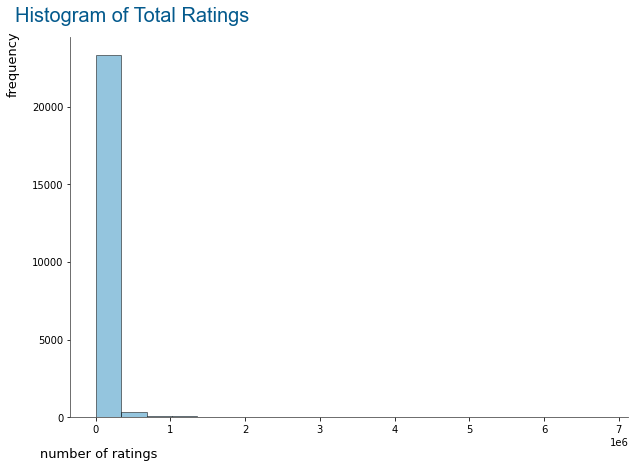

In [48]:
font = {'family': 'Arial',
'color': '#045a8d',
'size': 20}

num_bins = 20

fig, ax = plt.subplots(figsize = (10,7))

n, bins, patches = ax.hist(threeK_ratings['RatingDistTotal'], num_bins, facecolor='#2b8cbe', alpha=0.5, edgecolor='#000000', linewidth=1)

ax.set_title('Histogram of Total Ratings', pad = 15, fontdict=font)
ax.set_xlabel('number of ratings', fontsize = 13)
ax.set_ylabel('frequency', fontsize=13)

# set axis label positions
ax.yaxis.set_label_coords(-.09,.93)
ax.xaxis.set_label_coords(.05, -.08)
ax.title.set_position([.11, 1.03])

# remove spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

# spine color
ax.spines['left'].set_color('#4c4c4c')
ax.spines['bottom'].set_color('#4c4c4c')

# tick line color
for t in ax.xaxis.get_ticklines(): t.set_color('#4c4c4c')
for t in ax.yaxis.get_ticklines(): t.set_color('#4c4c4c')
    
plt.show()

### Publish Year Inspect

In [49]:
threeK_ratings.PublishYear.unique()

array([1991, 2003, 2000, 2006, 2001, 1994, 2005, 1999, 1987, 2007, 1993,
       1989, 1997, 2002, 1996, 1995, 1960, 1992, 1983, 2004, 1998, 1985,
       1982, 1984, 1980, 1990, 2008, 1988, 1986, 1981, 1975, 1972, 1974,
       1977, 1962, 1968, 1976, 1965, 1971, 1979, 1969, 2011, 1957, 2009,
       1978, 1963, 2015, 2012, 1964, 1947, 1954, 2016, 1970, 1973, 2010,
       1959, 1946, 1961, 1956, 1953, 2013, 1950, 1952, 2017, 2014, 1966,
       1928,  208, 1958, 2018, 1967, 2030, 1955, 1940, 2020, 1941, 1951,
       1948, 1927, 2019, 1903, 1931, 1905, 1900, 1907, 1949, 1898, 1933,
       1937, 1920, 1932, 1939, 2994, 1924, 1943, 1913, 1938, 1930, 1944,
       1945], dtype=int64)

In [51]:
threeK_ratings.loc[threeK_ratings.PublishYear == 208]

,Id,Name,RatingDist1,RatingDist4,RatingDistTotal,PublishMonth,PublishDay,Publisher,CountsOfReview,PublishYear,...,Rating,RatingDist2,RatingDist5,ISBN,RatingDist3,Description,Count of text reviews,PagesNumber,Title_Lang,Plot_Lang
177356,1155177,Agatha Raisin And The Witch Of Wyckhadden (Aga...,1:37,4:2612,6598,17,11,St Martin's Minotaur,16,208,...,3.75,2:313,5:1366,0312204949,3:2270,"Eye of newt, toe of frog ... and murder most f...",16.0,196.0,"('en', -142.60302019119263)","('en', -1626.760623216629)"


In [52]:
threeK_ratings.loc[threeK_ratings.Id == 1155177, 'PublishYear'] = 2000

In [53]:
threeK_ratings.loc[threeK_ratings.PublishYear == 2994]

,Id,Name,RatingDist1,RatingDist4,RatingDistTotal,PublishMonth,PublishDay,Publisher,CountsOfReview,PublishYear,...,Rating,RatingDist2,RatingDist5,ISBN,RatingDist3,Description,Count of text reviews,PagesNumber,Title_Lang,Plot_Lang
1035573,3243016,"Trials Of Death (The Saga Of Darren Shan, #5)",1:142,4:9105,27841,1,14,Gramedia Pustaka Utama,5,2994,...,4.25,2:818,5:13444,1554680662,3:4332,<strong>'ANNIHILATION BECKONS THE VAMPIRE'S AS...,NaN,176.0,"('en', -78.48879194259644)","('en', -994.3970112800598)"


In [54]:
threeK_ratings.loc[threeK_ratings.Id == 3243016, 'PublishYear'] = 2004

In [55]:
threeK_ratings.PublishYear.unique()

array([1991, 2003, 2000, 2006, 2001, 1994, 2005, 1999, 1987, 2007, 1993,
       1989, 1997, 2002, 1996, 1995, 1960, 1992, 1983, 2004, 1998, 1985,
       1982, 1984, 1980, 1990, 2008, 1988, 1986, 1981, 1975, 1972, 1974,
       1977, 1962, 1968, 1976, 1965, 1971, 1979, 1969, 2011, 1957, 2009,
       1978, 1963, 2015, 2012, 1964, 1947, 1954, 2016, 1970, 1973, 2010,
       1959, 1946, 1961, 1956, 1953, 2013, 1950, 1952, 2017, 2014, 1966,
       1928, 1958, 2018, 1967, 2030, 1955, 1940, 2020, 1941, 1951, 1948,
       1927, 2019, 1903, 1931, 1905, 1900, 1907, 1949, 1898, 1933, 1937,
       1920, 1932, 1939, 1924, 1943, 1913, 1938, 1930, 1944, 1945],
      dtype=int64)

### Select Columns for DF

In [56]:
threeK_ratings = threeK_ratings[['Id', 'Name', 'PublishYear', 'Authors', 'PagesNumber', 'Description']]

In [57]:
threeK_ratings.head(2)

,Id,Name,PublishYear,Authors,PagesNumber,Description
58301,1000014,Haroun And The Sea Of Stories,1991,Salman Rushdie,219.0,The author of The Satanic Verses returns with ...
58306,1000030,Anne Of Green Gables,2003,L.M. Montgomery,0.0,When Marilla and Matthew Cuthbert of Green Gab...


In [58]:
threeK_ratings.shape

(23979, 6)

In [59]:
threeK_ratings.isnull().sum()

Id             0
Name           0
PublishYear    0
Authors        0
PagesNumber    0
Description    0
dtype: int64

In [60]:
threeK_ratings.describe()

,Id,PublishYear,PagesNumber
count,2.397900e+04,23979.000000,23979.000000
mean,1.814742e+06,1998.319404,306.974353
std,9.526872e+05,10.669237,269.939232
min,6.000000e+05,1898.000000,0.000000
25%,1.071690e+06,1993.000000,160.000000
50%,1.492577e+06,2002.000000,284.000000
75%,2.395030e+06,2007.000000,399.000000
max,4.845422e+06,2030.000000,9998.000000


In [61]:
PublishYear = threeK_ratings['PublishYear']
PublishYear.mode()

0    2008
dtype: int64

### Graphs

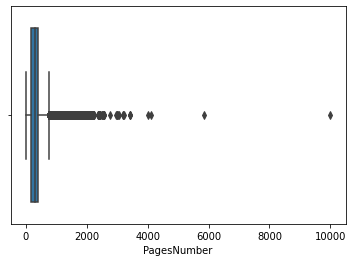

In [63]:
ax = sns.boxplot(x=threeK_ratings['PagesNumber'])

In [64]:
page_2000 = threeK_ratings.loc[threeK_ratings['PagesNumber'] > 2000]
page_2000.shape

(65, 6)

There are 65 books with a page length grater than 2,000 pages.

In [65]:
under_2000 = threeK_ratings.loc[threeK_ratings['PagesNumber']<2000]

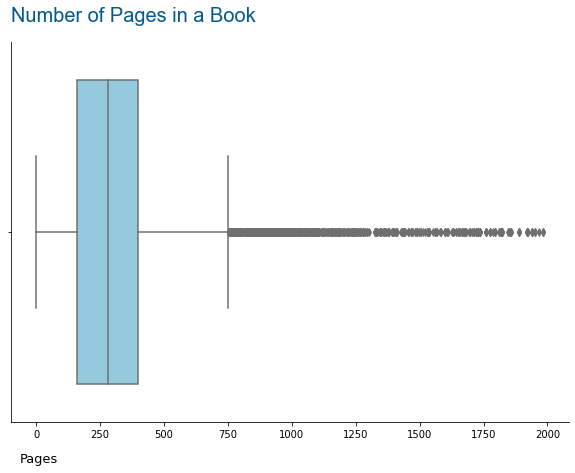

In [66]:
font = {'family': 'Arial',
'color': '#045a8d',
'size': 20}

# create figure
fig, ax = plt.subplots(figsize = (10,7))

sns.boxplot(x=under_2000['PagesNumber'], color='skyblue')

# title
ax.set_title('Number of Pages in a Book', fontdict=font, loc = 'center', pad=20)

# set x axis label
ax.set_xlabel('Pages', fontsize = 13)

# set axis label positions
ax.xaxis.set_label_coords(.05, -.08)
ax.title.set_position([.22, 1.03])

# remove spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

plt.savefig('graphs/boxplot_pages.jpg', format='jpg', dpi=300, bbox_inches='tight')

plt.show()

NameError: name 'twoK_ratings' is not defined

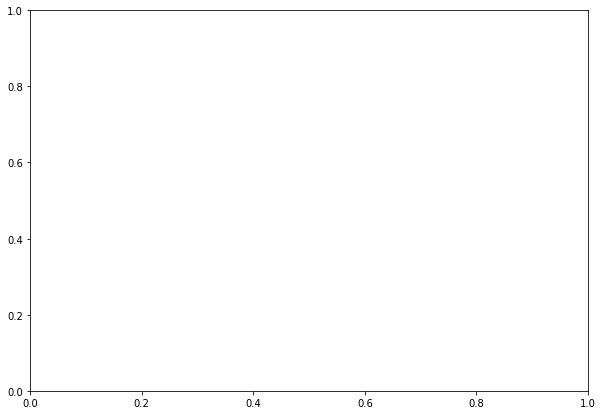

In [67]:
num_bins = 75

fig, ax = plt.subplots(figsize = (10,7))

n, bins, patches = ax.hist(twoK_ratings['PublishYear'], num_bins, facecolor='#2b8cbe', alpha=0.5, edgecolor='#000000', linewidth=1)

ax.set_title('Histogram of Year Published', fontsize = 15, pad=15)
ax.set_xlabel('years')
ax.set_ylabel('frequency')

plt.show()

In [69]:
over_1950 = threeK_ratings.loc[threeK_ratings['PublishYear']>1950]

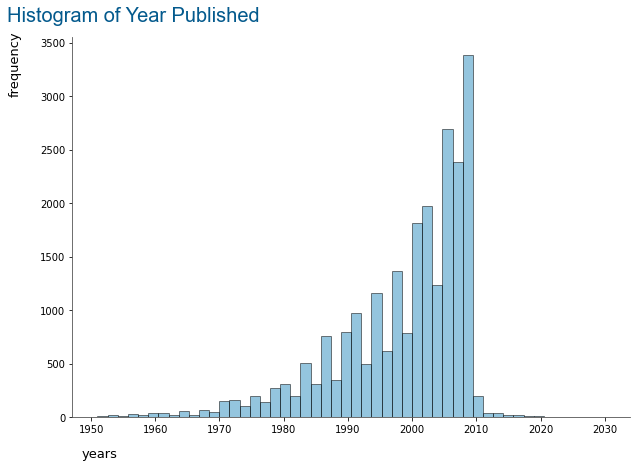

In [70]:
font = {'family': 'Arial',
'color': '#045a8d',
'size': 20}

num_bins = 50

fig, ax = plt.subplots(figsize = (10,7))

n, bins, patches = ax.hist(over_1950['PublishYear'], num_bins, facecolor='#2b8cbe', alpha=0.5, edgecolor='#000000', linewidth=1)

ax.set_title('Histogram of Year Published', pad = 15, fontdict=font)
ax.set_xlabel('years', fontsize = 13)
ax.set_ylabel('frequency', fontsize=13)

# set axis label positions
ax.yaxis.set_label_coords(-.09,.93)
ax.xaxis.set_label_coords(.05, -.08)
ax.title.set_position([.11, 1.03])

# remove spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)

# spine color
ax.spines['left'].set_color('#4c4c4c')
ax.spines['bottom'].set_color('#4c4c4c')

# tick line color
for t in ax.xaxis.get_ticklines(): t.set_color('#4c4c4c')
for t in ax.yaxis.get_ticklines(): t.set_color('#4c4c4c')

plt.savefig('graphs/hist_year_published.jpg', format='jpg', dpi=300, bbox_inches='tight')
plt.show()

In [71]:
# export cleaned df
threeK_ratings.to_csv('data/books_content.csv', index=False)

In [72]:
threeK_ratings.shape

(23979, 6)

## Books With Most Ratings

In [73]:
top_counts = df_books.drop_duplicates(subset=['Name', 'Authors'])

In [75]:
# top 10 books with most ratings
top_counts = top_counts.sort_values(by=['RatingDistTotal'], ascending=False)
top_counts.head(11)

,Id,Name,RatingDist1,RatingDist4,RatingDistTotal,PublishMonth,PublishDay,Publisher,CountsOfReview,PublishYear,...,Authors,Rating,RatingDist2,RatingDist5,ISBN,RatingDist3,Description,Count of text reviews,PagesNumber,Title_Lang
44759,77523,Harry Potter And The Sorcerer'S Stone,1:108772,4:1520706,6622480,1,9,Arthur A. Levine Books / Scholastic Inc.,2069,1998,...,J.K. Rowling,4.47,2:130886,5:4292138,0590353403,3:569978,NaN,NaN,309.0,"('en', -72.25395917892456)"
29681,49772,Harri Potter A Maen Yr Athronydd (Harry Potter...,1:108353,4:1516037,6599670,4,6,Bloomsbury Childrens,0,2003,...,J.K. Rowling,4.47,2:130524,5:4276245,1582348278,3:568511,NaN,NaN,300.0,"('en', -27.10304832458496)"
26122,43504,Harry Potter And The Philosopher'S Stone (Harr...,1:108340,4:1515924,6599146,1,7,Bloomsbury USA Childrens,0,2010,...,J.K. Rowling,4.47,2:130513,5:4275900,158234681X,3:568469,NaN,NaN,250.0,"('en', -75.90637016296387)"
2703,4255,Harry Potter And The Philosopher'S Stone,1:108208,4:1513308,6588013,4,10,Bloomsbury Publishing PLC,141,2004,...,J.K. Rowling,4.47,2:130321,5:4268678,NaN,3:567498,NaN,NaN,223.0,"('en', -70.34231996536255)"
2130,3357,Harry Potter Y La Piedra Filosofal (Harry Pott...,1:108208,4:1513284,6587900,6,3,Turtleback Books,14,2001,...,J.K. Rowling,4.47,2:130321,5:4268594,0613359607,3:567493,NaN,NaN,254.0,"('en', -41.011942863464355)"
2,3,Harry Potter And The Sorcerer'S Stone (Harry P...,1:108202,4:1513191,6587388,1,11,Scholastic Inc,75911,2003,...,J.K. Rowling,4.47,2:130310,5:4268227,NaN,3:567458,NaN,NaN,309.0,"('en', -77.81800937652588)"
805919,2767052,"The Hunger Games (The Hunger Games, #1)",1:92146,4:1902780,6313477,9,14,Scholastic Press,154447,2008,...,Suzanne Collins,4.33,2:170029,5:3410571,0439023483,3:737951,<b>WINNING MEANS FAME AND FORTUNE.<br />LOSING...,NaN,374.0,"('en', -85.92709922790527)"
25208,41865,"Twilight (Twilight, #1)",1:531054,4:1059392,4734773,6,9,"Little, Brown and Company",94850,2006,...,Stephenie Meyer,3.59,2:520599,5:1662040,0316015849,3:961688,NaN,NaN,501.0,"('en', 9.061840057373047)"
619227,2287904,"To Kill A Mockingbird (To Kill A Mockingbird, #1)",1:79176,4:1313835,4433149,12,30,Warner Books,83,1982,...,Harper Lee,4.28,2:147697,5:2326779,0446314862,3:565662,The unforgettable novel of a childhood in a sl...,NaN,284.0,"('en', -45.347917556762695)"
1723,2654,To Kill A Mockingbird,1:76482,4:1266041,4268356,5,7,Harper Perennial Modern Classics,902,2005,...,Harper Lee,4.27,2:143304,5:2234528,0060935464,3:548001,NaN,NaN,323.0,"('en', -18.143038749694824)"
